In [1]:
%load_ext autoreload
%autoreload 2

# Trade Strategy 20250603

## Description
Combine various individual strategies and assets to create a portfolio.

## Libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from utils.data_fetcher import TickerPriceDataFetcher
import os
from indicators.volatility import calculate_atr, calculate_forward_vol
from indicators.returns import calculate_returns, calculate_forward_returns, calculate_MA_returns, calculate_relative_volume
from utils.helpers import PercentileScaler
import datetime
from sklearn.linear_model import LinearRegression
from utils.backtester import BackTester
import backtrader as bt
from sklearn.metrics import r2_score
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from pypfopt.hierarchical_portfolio import HRPOpt
from pypfopt.plotting import plot_dendrogram
from pypfopt import risk_models
from scipy import stats

from utils.helpers import constrained_linear_regression, gmean, hmean, compute_r2



Warning - Certain functionality 
             requires requests_html, which is not installed.
             
             Install using: 
             pip install requests_html
             
             After installation, you may have to restart your Python session.


c:\Users\alexr\AlgoTester\utils\data_fetcher.py:19: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


## Utils

## Parameters

In [3]:
lookforward_period = 50
lookback_periods=[21, 50, 100, 200, 252]

rebalance_period = 21
atr_period = 21
covariance_matrix_lookback = 252
historical_lookback_period = 252 * 2
vol_target = 0.1
current_date = datetime.datetime.now().date()
current_date = current_date.strftime("%Y%m%d")

tickers_to_fetch = ['IB01.L', 'SHV', 'SPY', 'TLT', 'GLD', '^VIX', '^GVZ', 'PPLT', 'URA', 'DBA', 'EEM', 'LQD', 'IBIT', 'USO']
tickers_to_trade = [
    'SPY', 
    # 'TLT', 
    'GLD', 
    # '^VIX', 
    # '^GVZ', 
    'PPLT', 
    'URA', 
    'DBA', 
    'EEM', 
    'LQD', 
    'IBIT', 
    'USO'
]

## Load Data

In [4]:
fetcher = TickerPriceDataFetcher()
price_data = fetcher.load_data(ticker_list=tickers_to_fetch)

for ticker in price_data:
    print(ticker, price_data[ticker].index.to_list()[0], price_data[ticker].index.to_list()[-1])
    # display(price_data[ticker])


2025-07-13 16:47:04,620 - utils.data_fetcher - INFO - Loading data for ['IB01.L', 'SHV', 'SPY', 'TLT', 'GLD', '^VIX', '^GVZ', 'PPLT', 'URA', 'DBA', 'EEM', 'LQD', 'IBIT', 'USO']
2025-07-13 16:47:04,621 - utils.data_fetcher - INFO - Data for IB01.L already exists
2025-07-13 16:47:04,623 - utils.data_fetcher - INFO - Data for SHV already exists
2025-07-13 16:47:04,625 - utils.data_fetcher - INFO - Data for SPY already exists
2025-07-13 16:47:04,626 - utils.data_fetcher - INFO - Data for TLT already exists
2025-07-13 16:47:04,628 - utils.data_fetcher - INFO - Data for GLD already exists
2025-07-13 16:47:04,629 - utils.data_fetcher - INFO - Data for ^VIX already exists
2025-07-13 16:47:04,631 - utils.data_fetcher - INFO - Data for ^GVZ already exists
2025-07-13 16:47:04,633 - utils.data_fetcher - INFO - Data for PPLT already exists
2025-07-13 16:47:04,634 - utils.data_fetcher - INFO - Data for URA already exists
2025-07-13 16:47:04,636 - utils.data_fetcher - INFO - Data for DBA already exis

IB01.L 2019-02-20 00:00:00 2025-07-11 00:00:00
SHV 2007-01-11 00:00:00 2025-07-11 00:00:00
SPY 1993-01-29 00:00:00 2025-07-11 00:00:00
TLT 2002-07-30 00:00:00 2025-07-11 00:00:00
GLD 2004-11-18 00:00:00 2025-07-11 00:00:00
^VIX 1990-01-02 00:00:00 2025-07-11 00:00:00
^GVZ 2008-06-03 00:00:00 2025-07-11 00:00:00
PPLT 2010-01-08 00:00:00 2025-07-11 00:00:00
URA 2010-11-05 00:00:00 2025-07-11 00:00:00
DBA 2007-01-05 00:00:00 2025-07-11 00:00:00
EEM 2003-04-14 00:00:00 2025-07-11 00:00:00
LQD 2002-07-30 00:00:00 2025-07-11 00:00:00
IBIT 2024-01-11 00:00:00 2025-07-11 00:00:00
USO 2006-04-10 00:00:00 2025-07-11 00:00:00


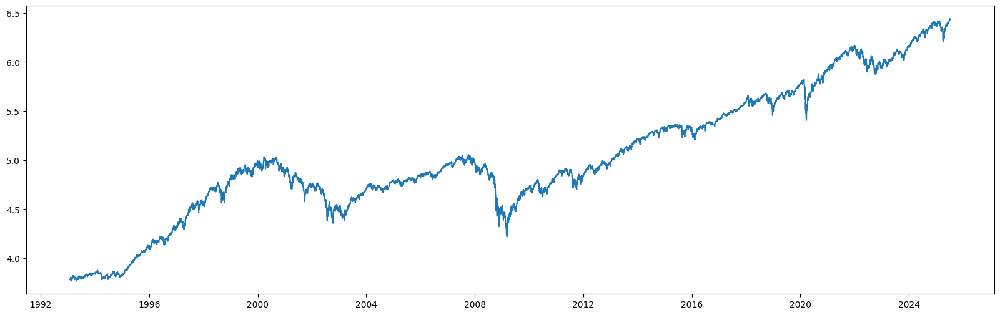

In [5]:
df = price_data['SPY'].copy()
df['log_close'] = np.log(df['close'])

plt.figure(figsize=(20, 6))
plt.plot(df['log_close'])
plt.show()

## Process Data

In [ ]:
def process_price_data(df, lookforward_period=21, atr_period=21, lookback_periods=[21, 100, 200, 252], vix_ticker=None):
    # Calculate indicators
    df['returns'] = df['close'].pct_change()
    df['vol_forward'] = calculate_forward_vol(df, lookforward_period)
    df['ret_forward'] = calculate_forward_returns(df, lookforward_period)
    df['ATR'] = calculate_atr(df, atr_period)
    df['var_forward'] = df['vol_forward'] ** 2
    if vix_ticker is not None:
        df['VIX'] = price_data[vix_ticker]['close'].copy()
    for period in lookback_periods:
        df[f'MA_{period}'] = calculate_MA_returns(df, period)
        df[f'vol_{period}'] = df['returns'].rolling(period).std()
    df['high_breakout_21'] = (df['close'] - df['close'].rolling(21).max()) / df['close']
    df['low_breakout_21'] = (df['close'] - df['close'].rolling(21).min()) / df['close']
    df['high_breakout_252'] = (df['close'] - df['close'].rolling(252).max()) / df['close']
    df['low_breakout_252'] = (df['close'] - df['close'].rolling(252).min()) / df['close']
    
    

    def compute_r2_signal(y):
        return compute_r2(np.log(y))

    for period in lookback_periods:
        df[f'r2_{period}'] = df['close'].rolling(period).apply(compute_r2_signal)


    df['relative_volume'] = calculate_relative_volume(df, 20, 50)

    # Ret_Features:
    # - Moving Averages
    for period in lookback_periods:
        df[f'RET_FEAT_MA_{period}'] = np.where(np.array(df[f'MA_{period}']) > 0, 1, -1)
        df[f'RET_FEAT_MA_{period}_r2_adj'] = df[f'RET_FEAT_MA_{period}'] * df[f'r2_{period}']
        df[f'RET_FEAT_MA_{period}_rel_volume_adj'] = df[f'RET_FEAT_MA_{period}'] * (df[f'relative_volume'] / df[f'relative_volume'].rolling(251, min_periods=1).mean())
        
        df[f'RET_FEAT_MA_{period}_vol_adj'] = df[f'RET_FEAT_MA_{period}'] * (df[f'vol_{period}'] / df[f'vol_{period}'].rolling(251, min_periods=1).mean())
    
    # - Returns
    for period in lookback_periods:
        df[f'RET_FEAT_ret_{period}'] = np.where(np.array(calculate_returns(df, period)) > 0, 1, -1)
        df[f'RET_FEAT_ret_{period}_r2_adj'] = df[f'RET_FEAT_ret_{period}'] * (df[f'r2_{period}'] / df[f'r2_{period}'].rolling(251, min_periods=1).mean())
        df[f'RET_FEAT_ret_{period}_rel_volume_adj'] = df[f'RET_FEAT_ret_{period}'] * (df[f'relative_volume'] / df[f'relative_volume'].rolling(251, min_periods=1).mean())
        df[f'RET_FEAT_ret_{period}_vol_adj'] = df[f'RET_FEAT_ret_{period}'] * (df[f'vol_{period}'] / df[f'vol_{period}'].rolling(251, min_periods=1).mean())
    
    # - Volatility
    df['RET_FEAT_ATR'] = 1 / (df['ATR'] / df['ATR'].rolling(251, min_periods=1).mean())
    if vix_ticker is not None:
        df['RET_FEAT_VIX'] = 1 / (df['VIX'] / df['VIX'].rolling(251, min_periods=1).mean())
    
    # - Breakouts
    for period in lookback_periods:
        if period <= rebalance_period:
            continue
        df[f'RET_FEAT_high_breakout_{period}'] = np.where(df['close'].rolling(rebalance_period).max() == df['close'].rolling(period).max(), 1, 0)
        df[f'RET_FEAT_low_breakout_{period}'] = np.where(df['close'].rolling(rebalance_period).min() == df['close'].rolling(period).min(), -1, 0)
        df[f'RET_FEAT_high_breakout_{period}_r2_adj'] = df[f'RET_FEAT_high_breakout_{period}'] * (df[f'r2_{period}'] / df[f'r2_{period}'].rolling(251, min_periods=1).mean())
        df[f'RET_FEAT_low_breakout_{period}_r2_adj'] = df[f'RET_FEAT_low_breakout_{period}'] * (df[f'r2_{period}'] / df[f'r2_{period}'].rolling(251, min_periods=1).mean())
        df[f'RET_FEAT_high_breakout_{period}_rel_volume_adj'] = df[f'RET_FEAT_high_breakout_{period}'] * (df[f'relative_volume'] / df[f'relative_volume'].rolling(251, min_periods=1).mean())
        df[f'RET_FEAT_low_breakout_{period}_vol_adj'] = df[f'RET_FEAT_low_breakout_{period}'] * (df[f'vol_{period}'] / df[f'vol_{period}'].rolling(251, min_periods=1).mean())
        df[f'RET_FEAT_high_breakout_{period}_rel_volume_adj'] = df[f'RET_FEAT_high_breakout_{period}'] * (df[f'relative_volume'] / df[f'relative_volume'].rolling(251, min_periods=1).mean())
        df[f'RET_FEAT_low_breakout_{period}_vol_adj'] = df[f'RET_FEAT_low_breakout_{period}'] * (df[f'vol_{period}'] / df[f'vol_{period}'].rolling(251, min_periods=1).mean())
    df = df.copy()
    
    
    # Base features
    for period in lookback_periods:
        df[f'BASE_FEAT_MA_{period}'] = df[f'MA_{period}']
        df[f'BASE_FEAT_MA_{period}_r2_adj'] = df[f'BASE_FEAT_MA_{period}'] * df[f'r2_{period}']
        df[f'BASE_FEAT_MA_{period}_rel_volume_adj'] = df[f'BASE_FEAT_MA_{period}'] * df[f'relative_volume']
        df[f'BASE_FEAT_MA_{period}_vol_adj'] = df[f'BASE_FEAT_MA_{period}'] * (df['returns'].rolling(period).std())
    
    # - Returns
    for period in lookback_periods:
        df[f'BASE_FEAT_ret_{period}'] = calculate_returns(df, period)
        df[f'BASE_FEAT_ret_{period}_r2_adj'] = df[f'BASE_FEAT_ret_{period}'] * df[f'r2_{period}']
        df[f'BASE_FEAT_ret_{period}_rel_volume_adj'] = df[f'BASE_FEAT_ret_{period}'] * df[f'relative_volume']
        df[f'BASE_FEAT_ret_{period}_vol_adj'] = df[f'BASE_FEAT_ret_{period}'] * (df['returns'].rolling(period).std())
    
    # - Volatility
    df['BASE_FEAT_ATR'] = df['ATR']
    if vix_ticker is not None:
        df['BASE_FEAT_VIX'] = df['VIX']
    
    # - Breakouts
    for period in lookback_periods:
        df[f'BASE_FEAT_high_breakout_{period}'] = (df['close'].rolling(period).max() - df['close']) / df['close']
        df[f'BASE_FEAT_low_breakout_{period}'] = (df['close'] - df['close'].rolling(period).min()) / df['close']
        df[f'BASE_FEAT_high_breakout_{period}_r2_adj'] = df[f'BASE_FEAT_high_breakout_{period}'] * df[f'r2_{period}']
        df[f'BASE_FEAT_low_breakout_{period}_r2_adj'] = df[f'BASE_FEAT_low_breakout_{period}'] * df[f'r2_{period}']
        df[f'BASE_FEAT_high_breakout_{period}_rel_volume_adj'] = df[f'BASE_FEAT_high_breakout_{period}'] * df[f'relative_volume']
        df[f'BASE_FEAT_low_breakout_{period}_vol_adj'] = df[f'BASE_FEAT_low_breakout_{period}'] * (df['returns'].rolling(period).std())
        df[f'BASE_FEAT_high_breakout_{period}_rel_volume_adj'] = df[f'BASE_FEAT_high_breakout_{period}'] * df[f'relative_volume']
        df[f'BASE_FEAT_low_breakout_{period}_vol_adj'] = df[f'BASE_FEAT_low_breakout_{period}'] * (df['returns'].rolling(period).std())
    df = df.copy()
    return df


risky_assets = dict()

# SPY - US equities
risky_assets['SPY'] = dict()
df = price_data['SPY'].copy()
risky_assets['SPY']['data'] = process_price_data(
    df, 
    vix_ticker='^VIX',
    lookforward_period=lookforward_period,
    atr_period=atr_period,
    lookback_periods=lookback_periods
)
display(risky_assets['SPY']['data'])

# TLT - US treasury bonds
risky_assets['TLT'] = dict()
df = price_data['TLT'].copy()
risky_assets['TLT']['data'] = process_price_data(
    df,
    lookforward_period=lookforward_period,
    atr_period=atr_period,
    lookback_periods=lookback_periods
)
display(risky_assets['TLT']['data'])

# GLD - Gold
risky_assets['GLD'] = dict()
df = price_data['GLD'].copy()
risky_assets['GLD']['data'] = process_price_data(
    df, 
    vix_ticker='^GVZ',
    lookforward_period=lookforward_period,
    atr_period=atr_period,
    lookback_periods=lookback_periods
)
display(risky_assets['GLD']['data'])

# EEM - Emerging markets
risky_assets['EEM'] = dict()
df = price_data['EEM'].copy()
risky_assets['EEM']['data'] = process_price_data(
    df,
    lookforward_period=lookforward_period,
    atr_period=atr_period,
    lookback_periods=lookback_periods
)
display(risky_assets['EEM']['data'])

# DBA - Agriculture
risky_assets['DBA'] = dict()
df = price_data['DBA'].copy()
risky_assets['DBA']['data'] = process_price_data(
    df,
    lookforward_period=lookforward_period,
    atr_period=atr_period,
    lookback_periods=lookback_periods
)
display(risky_assets['DBA']['data'])

# LQD - US corporate bonds
risky_assets['LQD'] = dict()
df = price_data['LQD'].copy()
risky_assets['LQD']['data'] = process_price_data(
    df,
    lookforward_period=lookforward_period,
    atr_period=atr_period,
    lookback_periods=lookback_periods
)
display(risky_assets['LQD']['data'])

# IBIT - Bitcoin
risky_assets['IBIT'] = dict()
df = price_data['IBIT'].copy()
risky_assets['IBIT']['data'] = process_price_data(
    df,
    lookforward_period=lookforward_period,
    atr_period=atr_period,
    lookback_periods=lookback_periods
)
display(risky_assets['IBIT']['data'])

# PPLT - platinum
risky_assets['PPLT'] = dict()
df = price_data['PPLT'].copy()
risky_assets['PPLT']['data'] = process_price_data(
    df,
    lookforward_period=lookforward_period,
    atr_period=atr_period,
    lookback_periods=lookback_periods
)
display(risky_assets['PPLT']['data'])

# URA - uranium
risky_assets['URA'] = dict()
df = price_data['URA'].copy()
risky_assets['URA']['data'] = process_price_data(
    df,
    lookforward_period=lookforward_period,
    atr_period=atr_period,
    lookback_periods=lookback_periods
)
display(risky_assets['URA']['data'])

# USO - oil
risky_assets['USO'] = dict()
df = price_data['USO'].copy()
risky_assets['USO']['data'] = process_price_data(
    df,
    lookforward_period=lookforward_period,
    atr_period=atr_period,
    lookback_periods=lookback_periods,
)
display(risky_assets['USO']['data'])



,open,high,low,close,adjclose,volume,dividends,stock_splits,capital_gains,returns,...,BASE_FEAT_high_breakout_200_r2_adj,BASE_FEAT_low_breakout_200_r2_adj,BASE_FEAT_high_breakout_200_rel_volume_adj,BASE_FEAT_low_breakout_200_vol_adj,BASE_FEAT_high_breakout_252,BASE_FEAT_low_breakout_252,BASE_FEAT_high_breakout_252_r2_adj,BASE_FEAT_low_breakout_252_r2_adj,BASE_FEAT_high_breakout_252_rel_volume_adj,BASE_FEAT_low_breakout_252_vol_adj
Date,,,,,,,,,,,,,,,,,,,,,
1993-01-29,43.968750,43.968750,43.750000,43.937500,24.380434,1003200,0.0,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1993-02-01,43.968750,44.250000,43.968750,44.250000,24.553843,480500,0.0,0.0,0.0,0.007112,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1993-02-02,44.218750,44.375000,44.125000,44.343750,24.605873,201300,0.0,0.0,0.0,0.002119,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1993-02-03,44.406250,44.843750,44.375000,44.812500,24.865980,529400,0.0,0.0,0.0,0.010571,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1993-02-04,44.968750,45.093750,44.468750,45.000000,24.970005,531500,0.0,0.0,0.0,0.004184,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-07,623.359985,624.030029,617.869995,620.679993,620.679993,74814500,0.0,0.0,0.0,-0.007452,...,1.571631e-05,0.000419,0.008013,0.002693,0.007508,0.200103,0.000899,0.023952,0.008013,0.002584
2025-07-08,621.349976,622.109985,619.520020,620.340027,620.340027,59024600,0.0,0.0,0.0,-0.000548,...,1.256403e-05,0.000311,0.008571,0.002687,0.008060,0.199665,0.000985,0.024399,0.008571,0.002578
2025-07-09,622.770020,624.719971,620.909973,624.059998,624.059998,66113300,0.0,0.0,0.0,0.005997,...,2.209120e-06,0.000220,0.002197,0.002752,0.002051,0.204435,0.000258,0.025671,0.002197,0.002639


,open,high,low,close,adjclose,volume,dividends,stock_splits,capital_gains,returns,...,BASE_FEAT_high_breakout_200_r2_adj,BASE_FEAT_low_breakout_200_r2_adj,BASE_FEAT_high_breakout_200_rel_volume_adj,BASE_FEAT_low_breakout_200_vol_adj,BASE_FEAT_high_breakout_252,BASE_FEAT_low_breakout_252,BASE_FEAT_high_breakout_252_r2_adj,BASE_FEAT_low_breakout_252_r2_adj,BASE_FEAT_high_breakout_252_rel_volume_adj,BASE_FEAT_low_breakout_252_vol_adj
Date,,,,,,,,,,,,,,,,,,,,,
2002-07-30,81.750000,81.900002,81.519997,81.519997,37.468719,6100,0.0,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2002-07-31,81.949997,82.800003,81.900002,82.529999,37.932934,29400,0.0,0.0,0.0,0.012390,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2002-08-01,82.540001,83.019997,82.540001,83.000000,38.148949,25000,0.0,0.0,0.0,0.005695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2002-08-02,83.160004,84.099998,82.879997,83.849998,38.539650,52800,0.0,0.0,0.0,0.010241,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2002-08-05,84.040001,84.440002,83.849998,84.220001,38.709717,61100,0.0,0.0,0.0,0.004413,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-07,86.540001,86.559998,85.919998,86.139999,86.139999,38314700,0.0,0.0,0.0,-0.009544,...,0.098058,0.014475,0.168935,0.000223,0.176341,0.025192,0.111790,0.015970,0.174566,0.000223
2025-07-08,85.570000,86.040001,85.440002,86.029999,86.029999,31407000,0.0,0.0,0.0,-0.001277,...,0.090242,0.013709,0.154054,0.000212,0.177845,0.023945,0.114149,0.015369,0.173822,0.000211
2025-07-09,86.190002,86.930000,86.180000,86.930000,86.930000,29821900,0.0,0.0,0.0,0.010461,...,0.080472,0.019319,0.138705,0.000301,0.165651,0.034050,0.107133,0.022022,0.161991,0.000301


,open,high,low,close,adjclose,volume,dividends,stock_splits,capital_gains,returns,...,BASE_FEAT_high_breakout_200_r2_adj,BASE_FEAT_low_breakout_200_r2_adj,BASE_FEAT_high_breakout_200_rel_volume_adj,BASE_FEAT_low_breakout_200_vol_adj,BASE_FEAT_high_breakout_252,BASE_FEAT_low_breakout_252,BASE_FEAT_high_breakout_252_r2_adj,BASE_FEAT_low_breakout_252_r2_adj,BASE_FEAT_high_breakout_252_rel_volume_adj,BASE_FEAT_low_breakout_252_vol_adj
Date,,,,,,,,,,,,,,,,,,,,,
2004-11-18,44.430000,44.490002,44.070000,44.380001,44.380001,5992000,0.0,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2004-11-19,44.490002,44.919998,44.470001,44.779999,44.779999,11655300,0.0,0.0,0.0,0.009013,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2004-11-22,44.750000,44.970001,44.740002,44.950001,44.950001,11996000,0.0,0.0,0.0,0.003796,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2004-11-23,44.880001,44.919998,44.720001,44.750000,44.750000,3169200,0.0,0.0,0.0,-0.004449,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2004-11-24,44.930000,45.049999,44.790001,45.049999,45.049999,6105100,0.0,0.0,0.0,0.006704,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-07,305.070007,307.709991,304.529999,307.369995,307.369995,7351600,0.0,0.0,0.0,0.000749,...,0.025044,0.201759,0.026776,0.002718,0.029020,0.290790,0.026486,0.265396,0.026776,0.003258
2025-07-08,306.299988,306.450012,302.769989,304.160004,304.160004,11840500,0.0,0.0,0.0,-0.010443,...,0.034411,0.194748,0.037514,0.002629,0.039880,0.282647,0.036384,0.257868,0.037514,0.003169
2025-07-09,303.579987,305.540009,303.230011,305.519989,305.519989,10644100,0.0,0.0,0.0,0.004471,...,0.030403,0.194585,0.033762,0.002624,0.035251,0.285841,0.032159,0.260765,0.033762,0.003197


,open,high,low,close,adjclose,volume,dividends,stock_splits,capital_gains,returns,...,BASE_FEAT_high_breakout_200_r2_adj,BASE_FEAT_low_breakout_200_r2_adj,BASE_FEAT_high_breakout_200_rel_volume_adj,BASE_FEAT_low_breakout_200_vol_adj,BASE_FEAT_high_breakout_252,BASE_FEAT_low_breakout_252,BASE_FEAT_high_breakout_252_r2_adj,BASE_FEAT_low_breakout_252_r2_adj,BASE_FEAT_high_breakout_252_rel_volume_adj,BASE_FEAT_low_breakout_252_vol_adj
Date,,,,,,,,,,,,,,,,,,,,,
2003-04-14,11.144444,11.222222,11.144444,11.222222,7.340263,93600,0.0,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2003-04-15,11.291111,11.388889,11.291111,11.355556,7.427476,421200,0.0,0.0,0.0,0.011881,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2003-04-16,11.477778,11.533333,11.477778,11.486667,7.513234,9000,0.0,0.0,0.0,0.011546,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2003-04-17,11.550000,11.572222,11.530000,11.568889,7.567012,17100,0.0,0.0,0.0,0.007158,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2003-04-21,11.582222,11.583333,11.555556,11.564444,7.564106,72900,0.0,0.0,0.0,-0.000384,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-07,48.279999,48.389999,47.959999,48.070000,48.070000,24462300,0.0,0.0,0.0,-0.014151,...,0.000861,0.011922,0.015973,0.002517,0.014354,0.198669,0.002157,0.029859,0.015973,0.002442
2025-07-08,48.369999,48.419998,48.240002,48.369999,48.369999,16316900,0.0,0.0,0.0,0.006241,...,0.000521,0.013171,0.009061,0.002581,0.008063,0.203639,0.001272,0.032132,0.009061,0.002497
2025-07-09,48.380001,48.380001,48.150002,48.290001,48.290001,14846200,0.0,0.0,0.0,-0.001654,...,0.000671,0.013938,0.010810,0.002564,0.009733,0.202319,0.001612,0.033520,0.010810,0.002481


,open,high,low,close,adjclose,volume,dividends,stock_splits,capital_gains,returns,...,BASE_FEAT_high_breakout_200_r2_adj,BASE_FEAT_low_breakout_200_r2_adj,BASE_FEAT_high_breakout_200_rel_volume_adj,BASE_FEAT_low_breakout_200_vol_adj,BASE_FEAT_high_breakout_252,BASE_FEAT_low_breakout_252,BASE_FEAT_high_breakout_252_r2_adj,BASE_FEAT_low_breakout_252_r2_adj,BASE_FEAT_high_breakout_252_rel_volume_adj,BASE_FEAT_low_breakout_252_vol_adj
Date,,,,,,,,,,,,,,,,,,,,,
2007-01-05,24.930000,25.049999,24.850000,25.020000,21.559393,27800,0.0,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2007-01-08,25.940001,25.940001,24.840000,24.980000,21.524927,143600,0.0,0.0,0.0,-0.001599,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2007-01-09,24.799999,24.820000,24.600000,24.660000,21.249186,136700,0.0,0.0,0.0,-0.012810,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2007-01-10,24.700001,24.820000,24.500000,24.730000,21.309505,76600,0.0,0.0,0.0,0.002839,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2007-01-11,24.900000,25.129999,24.799999,25.100000,21.628328,159600,0.0,0.0,0.0,0.014962,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-07,25.670000,25.740000,25.600000,25.709999,25.709999,237400,0.0,0.0,0.0,-0.006953,...,0.018336,0.006181,0.112650,0.000333,0.103851,0.095294,0.057212,0.052498,0.112650,0.000926
2025-07-08,25.719999,25.740000,25.590000,25.740000,25.740000,120800,0.0,0.0,0.0,0.001167,...,0.016308,0.005745,0.109428,0.000343,0.102564,0.096348,0.055042,0.051706,0.109428,0.000936
2025-07-09,25.780001,25.930000,25.740000,25.930000,25.930000,121500,0.0,0.0,0.0,0.007382,...,0.013734,0.006278,0.096137,0.000410,0.094485,0.102970,0.049561,0.054011,0.096137,0.001001


,open,high,low,close,adjclose,volume,dividends,stock_splits,capital_gains,returns,...,BASE_FEAT_high_breakout_200_r2_adj,BASE_FEAT_low_breakout_200_r2_adj,BASE_FEAT_high_breakout_200_rel_volume_adj,BASE_FEAT_low_breakout_200_vol_adj,BASE_FEAT_high_breakout_252,BASE_FEAT_low_breakout_252,BASE_FEAT_high_breakout_252_r2_adj,BASE_FEAT_low_breakout_252_r2_adj,BASE_FEAT_high_breakout_252_rel_volume_adj,BASE_FEAT_low_breakout_252_vol_adj
Date,,,,,,,,,,,,,,,,,,,,,
2002-07-30,101.300003,102.000000,101.250000,101.370003,38.376278,21200,0.0,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2002-07-31,101.800003,102.250000,101.550003,101.989998,38.610977,272000,0.0,0.0,0.0,0.006116,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2002-08-01,102.400002,103.099998,102.300003,102.989998,38.989578,111700,0.0,0.0,0.0,0.009805,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2002-08-02,102.900002,103.300003,102.449997,103.199997,39.069035,29200,0.0,0.0,0.0,0.002039,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2002-08-05,103.650002,103.650002,102.510002,102.949997,38.974396,166500,0.0,0.0,0.0,-0.002422,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-07,108.860001,108.860001,108.290001,108.410004,108.410004,18303300,0.0,0.0,0.0,-0.005960,...,0.017286,0.010775,0.049909,0.000151,0.048981,0.030532,0.016655,0.010382,0.049909,0.000146
2025-07-08,108.160004,108.190002,108.010002,108.099998,108.099998,29374900,0.0,0.0,0.0,-0.002860,...,0.016904,0.009426,0.050339,0.000138,0.051989,0.027752,0.018115,0.009670,0.052585,0.000132
2025-07-09,108.349998,108.739998,108.250000,108.720001,108.720001,33182900,0.0,0.0,0.0,0.005735,...,0.014140,0.010753,0.044837,0.000165,0.045990,0.033297,0.016179,0.011714,0.047098,0.000158


,open,high,low,close,adjclose,volume,dividends,stock_splits,capital_gains,returns,...,BASE_FEAT_high_breakout_200_r2_adj,BASE_FEAT_low_breakout_200_r2_adj,BASE_FEAT_high_breakout_200_rel_volume_adj,BASE_FEAT_low_breakout_200_vol_adj,BASE_FEAT_high_breakout_252,BASE_FEAT_low_breakout_252,BASE_FEAT_high_breakout_252_r2_adj,BASE_FEAT_low_breakout_252_r2_adj,BASE_FEAT_high_breakout_252_rel_volume_adj,BASE_FEAT_low_breakout_252_vol_adj
Date,,,,,,,,,,,,,,,,,,,,,
2024-01-11,27.940001,30.000000,26.280001,26.629999,26.629999,37657300,0.0,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-12,26.400000,26.410000,24.750000,24.969999,24.969999,22846800,0.0,0.0,0.0,-0.062336,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-16,24.700001,24.862000,24.040001,24.719999,24.719999,15078200,0.0,0.0,0.0,-0.010012,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-17,24.350000,24.559999,24.150000,24.410000,24.410000,13964500,0.0,0.0,0.0,-0.012540,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-18,24.350000,24.469999,23.200001,23.340000,23.340000,17823200,0.0,0.0,0.0,-0.043834,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-07,61.630001,61.775002,61.040001,61.400002,61.400002,37793400,0.0,0.0,0.0,-0.012703,...,0.014182,0.212726,0.028195,0.013645,0.029805,0.504723,0.020619,0.349165,0.028195,0.016589
2025-07-08,61.900002,62.105000,61.400002,61.820000,61.820000,29471500,0.0,0.0,0.0,0.006840,...,0.010755,0.212584,0.021433,0.013726,0.022808,0.508088,0.015766,0.351206,0.021433,0.016681
2025-07-09,62.290001,63.759998,61.630001,63.580002,63.580002,56974400,0.0,0.0,0.0,0.028470,...,0.000000,0.218187,0.000000,0.014213,0.000000,0.521705,0.000000,0.360101,0.000000,0.017001


,open,high,low,close,adjclose,volume,dividends,stock_splits,capital_gains,returns,...,BASE_FEAT_high_breakout_200_r2_adj,BASE_FEAT_low_breakout_200_r2_adj,BASE_FEAT_high_breakout_200_rel_volume_adj,BASE_FEAT_low_breakout_200_vol_adj,BASE_FEAT_high_breakout_252,BASE_FEAT_low_breakout_252,BASE_FEAT_high_breakout_252_r2_adj,BASE_FEAT_low_breakout_252_r2_adj,BASE_FEAT_high_breakout_252_rel_volume_adj,BASE_FEAT_low_breakout_252_vol_adj
Date,,,,,,,,,,,,,,,,,,,,,
2010-01-08,158.070007,160.000000,155.800003,159.000000,159.000000,414700,0.0,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-11,160.949997,165.000000,159.149994,160.210007,160.210007,234600,0.0,0.0,0.0,0.007610,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-12,159.039993,160.389999,155.080002,157.160004,157.160004,435700,0.0,0.0,0.0,-0.019038,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-13,157.240005,158.149994,155.600006,158.029999,158.029999,367000,0.0,0.0,0.0,0.005536,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-14,160.130005,161.850006,159.720001,161.449997,161.449997,228500,0.0,0.0,0.0,0.021641,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-07,123.510002,125.419998,123.160004,125.160004,125.160004,310000,0.0,0.0,0.0,0.000160,...,0.012051,0.102435,0.060944,0.005565,0.039949,0.339565,0.010508,0.089318,0.060944,0.005538
2025-07-08,124.459999,125.379997,122.500000,124.739998,124.739998,508000,0.0,0.0,0.0,-0.003356,...,0.013673,0.106151,0.063963,0.005527,0.043450,0.337342,0.011969,0.092928,0.063963,0.005503
2025-07-09,123.879997,123.949997,122.139999,122.860001,122.860001,312400,0.0,0.0,0.0,-0.015071,...,0.019383,0.106741,0.084132,0.005363,0.059417,0.327202,0.017244,0.094962,0.084132,0.005319


,open,high,low,close,adjclose,volume,dividends,stock_splits,capital_gains,returns,...,BASE_FEAT_high_breakout_200_r2_adj,BASE_FEAT_low_breakout_200_r2_adj,BASE_FEAT_high_breakout_200_rel_volume_adj,BASE_FEAT_low_breakout_200_vol_adj,BASE_FEAT_high_breakout_252,BASE_FEAT_low_breakout_252,BASE_FEAT_high_breakout_252_r2_adj,BASE_FEAT_low_breakout_252_r2_adj,BASE_FEAT_high_breakout_252_rel_volume_adj,BASE_FEAT_low_breakout_252_vol_adj
Date,,,,,,,,,,,,,,,,,,,,,
2010-11-05,103.440002,103.440002,99.480003,103.260002,69.925400,48233,0.0,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-11-08,104.699997,114.779999,103.919998,114.779999,77.726494,255017,0.0,0.0,0.0,0.111563,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-11-09,116.160004,119.519997,109.800003,111.000000,75.166756,334967,0.0,0.0,0.0,-0.032933,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-11-10,111.959999,113.099998,108.000000,112.739998,76.345047,121967,0.0,0.0,0.0,0.015676,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-11-11,114.000000,114.120003,111.120003,113.699997,76.995155,111767,0.0,0.0,0.0,0.008515,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-07,37.500000,38.000000,36.759998,37.980000,37.980000,3165800,0.0,0.0,0.0,0.002111,...,2.071957e-06,0.000044,0.024234,0.012082,0.021854,0.466561,0.000389,0.008311,0.024234,0.012211
2025-07-08,38.169998,38.169998,36.570000,37.020000,37.020000,3388200,0.0,0.0,0.0,-0.025276,...,1.390680e-07,0.000001,0.053788,0.011747,0.048352,0.452728,0.001075,0.010068,0.053788,0.011840
2025-07-09,36.660000,36.869999,36.330002,36.730000,36.730000,3749100,0.0,0.0,0.0,-0.007834,...,1.606128e-06,0.000013,0.059619,0.011637,0.056630,0.448407,0.001522,0.012048,0.059619,0.011729


,open,high,low,close,adjclose,volume,dividends,stock_splits,capital_gains,returns,...,BASE_FEAT_high_breakout_200_r2_adj,BASE_FEAT_low_breakout_200_r2_adj,BASE_FEAT_high_breakout_200_rel_volume_adj,BASE_FEAT_low_breakout_200_vol_adj,BASE_FEAT_high_breakout_252,BASE_FEAT_low_breakout_252,BASE_FEAT_high_breakout_252_r2_adj,BASE_FEAT_low_breakout_252_r2_adj,BASE_FEAT_high_breakout_252_rel_volume_adj,BASE_FEAT_low_breakout_252_vol_adj
Date,,,,,,,,,,,,,,,,,,,,,
2006-04-10,546.000000,548.000000,541.359985,544.159973,544.159973,484738,0.0,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-04-11,546.559998,547.119995,538.400024,545.599976,545.599976,162138,0.0,0.0,0.0,0.002646,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-04-12,545.760010,550.479980,542.479980,542.719971,542.719971,156038,0.0,0.0,0.0,-0.005279,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-04-13,540.000000,551.919983,539.200012,550.559998,550.559998,70088,0.0,0.0,0.0,0.014446,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-04-17,553.599976,559.200012,549.440002,558.320007,558.320007,114713,0.0,0.0,0.0,0.014095,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-07,75.839996,76.889999,75.570000,76.480003,76.480003,6155000,0.0,0.0,0.0,0.017157,...,0.005054,0.009072,0.172502,0.003918,0.102772,0.184493,0.011661,0.020934,0.172502,0.003835
2025-07-08,76.180000,77.589996,76.050003,76.959999,76.959999,4287200,0.0,0.0,0.0,0.006276,...,0.004462,0.008820,0.161387,0.004024,0.095894,0.189579,0.009869,0.019511,0.161387,0.003941
2025-07-09,76.449997,77.519997,76.279999,76.930000,76.930000,3839700,0.0,0.0,0.0,-0.000390,...,0.004336,0.008520,0.162398,0.004012,0.096321,0.189263,0.008936,0.017559,0.162398,0.003935


In [7]:
df = risky_assets['SPY']['data'].copy()
print(df[[f for f in df.columns if f.startswith('BASE_FEAT')]])
    

            BASE_FEAT_MA_21  BASE_FEAT_MA_21_r2_adj  \
Date                                                  
1993-01-29              NaN                     NaN   
1993-02-01              NaN                     NaN   
1993-02-02              NaN                     NaN   
1993-02-03              NaN                     NaN   
1993-02-04              NaN                     NaN   
...                     ...                     ...   
2025-07-07         0.023759                0.017293   
2025-07-08         0.021009                0.015236   
2025-07-09         0.025130                0.019127   
2025-07-10         0.025923                0.020581   
2025-07-11         0.020680                0.017244   

            BASE_FEAT_MA_21_rel_volume_adj  BASE_FEAT_MA_21_vol_adj  \
Date                                                                  
1993-01-29                             NaN                      NaN   
1993-02-01                             NaN                      NaN   


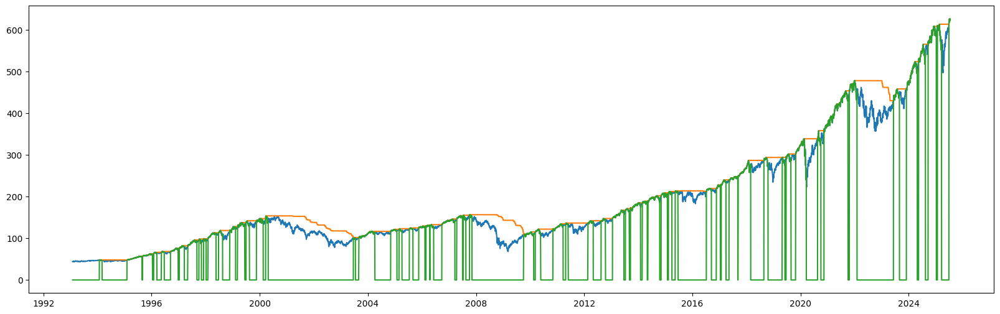

In [8]:
df = risky_assets['SPY']['data'].copy()
df['max_close'] = df['close'].rolling(252).max()

plt.figure(figsize=(20, 6))
plt.plot(df['close'])
plt.plot(df['max_close'])
plt.plot(df['RET_FEAT_high_breakout_252'] * df['close'])
plt.show()

## Define Strategy

In [18]:
leverage_tracker = []
allocation_tracker = []


def allocation_func(
    ticker_list, 
    lookback_periods, 
    historical_period, 
    current_date,
    dict_data,
    covariance_matrix_lookback,
    verbose=False
):
    #################################################################
    # Compute Asset-level allocation using Hierarchical Risk Parity 
    #################################################################
    if len(ticker_list) > 1:
        
        df_combined = pd.DataFrame()
        for ticker in ticker_list:
            df_data = dict_data[ticker].copy()
            df_data = df_data[df_data.index <= current_date].copy()
            df_data = df_data.iloc[-historical_period:]
            df_data['returns'] = df_data['close'].pct_change()
            df_combined[ticker] = df_data['returns']
        
        df_combined.dropna(inplace=True)
        

        # Covariance Matrix with Exponentially Weighted Moving Average
        ewma_cov = risk_models.exp_cov(df_combined, returns_data=True, span=covariance_matrix_lookback)

        # Convariance Matrix with Ledoit Wolf shrinkage
        ledoit_wolf_cov = risk_models.CovarianceShrinkage(
            prices=df_combined.iloc[-covariance_matrix_lookback:], 
            returns_data=True
        ).ledoit_wolf()

        # Final Covariance Matrix is mean of EWMA and Ledoit Wolf
        cov = (ledoit_wolf_cov + ewma_cov) / 2

        # HRP to generate asset allocation weights
        hrpopt = HRPOpt(
            cov_matrix=cov
        )
        asset_allocation_weights = hrpopt.optimize()

        # Limit weights to be between 5% and 50%
        for ticker in ticker_list:
            asset_allocation_weights[ticker] = np.clip(asset_allocation_weights[ticker], 0.05, 0.5)
            
    else:
        # Single asset case
        asset_allocation_weights = {ticker_list[0]: 1}
    

    #################################################################
    # Compute Strategy Allocations
    #################################################################
    allocation_tracker.append(dict())
    for ticker in ticker_list:

        # Limit data to current date
        df_data = dict_data[ticker]
        df_data = df_data[df_data.index <= current_date].copy()
        
        # Limit date to lookback period
        # df_data = df_data.iloc[-historical_period:]
        

        #########################
        # Vol Forecast
        # Vol scaling factor computation logic:
        #########################
        # Define features
        X_features = [f for f in df_data.columns if 'BASE_FEAT' in f]
        df_train = df_data[X_features + ['vol_forward']].copy()

        # drop na values
        df_train = df_train.dropna()

        # Scale features
        X_scaler = RobustScaler()
        df_train[X_features] = X_scaler.fit_transform(df_train[X_features])

        # Split into train and test
        X_train = df_train[X_features].iloc[:-1]
        X_test =  df_data[X_features].iloc[-1:]
        X_test = pd.DataFrame(X_test, columns=X_features)
        X_test[X_features] = X_scaler.transform(X_test)
        
        if verbose:
            print('-------------------------------------------------------')
            print(ticker, X_train.index.values[-1], X_test.index.values[0])

        # y feature = vol forward
        y_train = df_train['vol_forward'].iloc[:-1]
        model = LinearRegression()
        model.fit(X_train, y_train)
        vol_forecast = model.predict(X_test)[0]

        # Transform vol forecast to be between 0 and 1 as percentile of vol distribution
        # Higher vol forecast = lower vol scaling factor
        pct_rank = stats.percentileofscore(y_train, vol_forecast, kind='rank') / 100
        vol_scaling_factor = (1 - pct_rank) * 1.0

        # Constraint vol scaling factor to be between 0.1 and 1
        vol_scaling_factor = np.clip(vol_scaling_factor, 0.1, 1.0)

        

        if verbose: 
            print(f'vol_scaling_factor: {vol_scaling_factor:.3f}')
            # Extract coefficients and feature names
            coefficients = model.coef_
            feature_names = X_train.columns.tolist()

            # Create DataFrame and sort by coefficient value
            coef_df = pd.DataFrame({'feature': feature_names, 'Coefficient': coefficients})
            coef_df = coef_df.sort_values('Coefficient', ascending=False)  # Sort descending

            # Create plot
            plt.figure(figsize=(8, 10))
            colors = np.where(coef_df['Coefficient'] >= 0, 'dodgerblue', 'crimson')  # Color coding
            plt.barh(coef_df['feature'], coef_df['Coefficient'], color=colors, edgecolor='black')
            plt.axvline(0, color='gray', linestyle='--', alpha=0.7)  # Zero line
            plt.xlabel('Coefficient Value', fontsize=12)
            plt.title('Linear Regression Coefficients', fontsize=14, pad=15)
            plt.gca().invert_yaxis()  # Highest coefficient at top
            plt.grid(axis='x', alpha=0.3)
            plt.tight_layout()
            plt.show()

            # Record model performance
            y_pred = model.predict(X_train)
            y_true = y_train
            plt.figure(figsize=(10, 6))
            plt.scatter(y_true, y_pred, alpha=0.5)
            plt.plot([min(y_true), max(y_true)], [min(y_true), max(y_true)], 'k--', lw=2)
            plt.xlabel('True Values')
            plt.ylabel('Predicted Values')
            plt.title('Volatility Forecast Performance')
            plt.grid(True)
            plt.show()




        #########################
        # Unconstrained Ret Forecast
        #########################
        # Define features
        X_features = [f for f in df_data.columns if 'BASE_FEAT' in f]
        df_train = df_data[X_features + ['ret_forward']].copy()

        # drop na values
        df_train = df_train.dropna()

        # Scale features
        X_scaler = RobustScaler()
        df_train[X_features] = X_scaler.fit_transform(df_train[X_features])

        # Split into train and test
        X_train = df_train[X_features].iloc[:-1]
        X_test =  df_data[X_features].iloc[-1:]
        X_test = pd.DataFrame(X_test, columns=X_features)
        X_test[X_features] = X_scaler.transform(X_test)

        # y = forward returns
        y_train = df_train['ret_forward'].iloc[:-1]
        model = LinearRegression()
        model.fit(X_train, y_train)
        ret_forecast = model.predict(X_test)[0]
        ret_scaling_factor = 1
        
        # If ret forecast is negative, short position but with 5% size
        if ret_forecast < 0:
            ret_scaling_factor = -0.05
        else:
            # pct_rank -> scale ret_forecast to be between 0 and 1 as percentile of ret distribution
            # scale rank as forecasted return relative to prior returns
            pct_rank = stats.percentileofscore(y_train, ret_forecast, kind='rank') / 100
            ret_scaling_factor = pct_rank
            
            # Upscale ret_scaling_factor by 20% and clip between 10% and 120%
            ret_scaling_factor = pct_rank * 1.2
            ret_scaling_factor = np.clip(ret_scaling_factor, 0.1, 1.0)

            if verbose: print(f'pct_rank: {pct_rank:.3f}')
        
        ret_scaling_factor_unconstrained = ret_scaling_factor

        

        if verbose: 
            print(f'ret_scaling_factor: {ret_scaling_factor:.3f}')
            print(f"Training:       {np.min(y_train) + 1:.2%}, {gmean(y_train + 1):.2%}, {np.max(y_train) + 1:.2%}")
            print(f'ret forecast:   {ret_forecast + 1 :.2%}, Annualized: {(ret_forecast + 1) ** (252 / lookforward_period) - 1:.2%}')
            
            # Extract coefficients and feature names
            coefficients = model.coef_
            feature_names = X_train.columns.tolist()

            # Create DataFrame and sort by coefficient value
            coef_df = pd.DataFrame({'feature': feature_names, 'Coefficient': coefficients})
            coef_df = coef_df.sort_values('Coefficient', ascending=False)  # Sort descending

            # Create plot
            plt.figure(figsize=(8, 10))
            colors = np.where(coef_df['Coefficient'] >= 0, 'dodgerblue', 'crimson')  # Color coding
            plt.barh(coef_df['feature'], coef_df['Coefficient'], color=colors, edgecolor='black')
            plt.axvline(0, color='gray', linestyle='--', alpha=0.7)  # Zero line
            plt.xlabel('Coefficient Value', fontsize=12)
            plt.title('Linear Regression Coefficients', fontsize=14, pad=15)
            plt.gca().invert_yaxis()  # Highest coefficient at top
            plt.grid(axis='x', alpha=0.3)
            plt.tight_layout()
            plt.show()

            # Record model performance
            y_pred = model.predict(X_train)
            y_true = y_train
            plt.figure(figsize=(10, 6))
            plt.scatter(y_true, y_pred, alpha=0.5)
            plt.plot([min(y_true), max(y_true)], [min(y_true), max(y_true)], 'k--', lw=2)
            plt.xlabel('True Values')
            plt.ylabel('Predicted Values')
            plt.title('Return Forecast Performance')
            plt.grid(True)
            plt.show()
        



        #########################
        # Constrained Ret Forecast
        #########################
        # Define features
        X_features = [f for f in df_data.columns if 'RET_FEAT' in f]
        df_train = df_data[X_features + ['ret_forward']].copy()
        df_train = df_train.dropna()
        X_train = df_train[X_features].iloc[:-1]
        X_test =  df_data[X_features].iloc[-1:]
        X_test = pd.DataFrame(X_test, columns=X_features)
        y_train = df_train['ret_forward'].iloc[:-1]
        y_train = np.array([1 if f > 0 else -1 for f in y_train])
        intercept, coeff = constrained_linear_regression(X_train, y_train, False, False)
        
        ret_forecast = np.dot(X_test, coeff) + intercept
        ret_scaling_factor = ret_forecast[0]
        
        # If ret forecast is negative, short position but with 5% size
        if ret_forecast < 0:
            ret_scaling_factor = -0.05
        # else:
        #     # pct_rank = stats.percentileofscore(y_train, ret_forecast, kind='rank') / 100
        #     # target_rank = ret_forecast / (1.1 ** (lookforward_period / 252) - 1)
        #     # ret_scaling_factor = (pct_rank + target_rank) / 2
        #     ret_scaling_factor = ret_forecast[0]

            
        #     # Upscale ret_scaling_factor by 20% and clip between 10% and 120%
        #     # ret_scaling_factor = pct_rank * 1.2
            
        #     ret_scaling_factor = np.clip(ret_scaling_factor, 0.1, 1.0)
        
        # # if df_data.iloc[-1]['MA_252'] > 0:
        # #     if ret_scaling_factor < 0:
        # #         ret_scaling_factor = 0.01
        # # else:
        # #     if ret_scaling_factor > 0:
        # #         ret_scaling_factor = 0.01

        ret_scaling_factor_constrained = ret_scaling_factor
        
        # Record model performance

        if verbose: 
            print(f'constrained_ret_scaling_factor: {ret_scaling_factor_constrained:.3f}')
            
            # Extract coefficients and feature names
            coefficients = coeff
            feature_names = X_train.columns.tolist()

            # Create DataFrame and sort by coefficient value
            coef_df = pd.DataFrame({'feature': feature_names, 'Coefficient': coefficients})
            coef_df = coef_df.sort_values('Coefficient', ascending=False)  # Sort descending

            # Create plot
            plt.figure(figsize=(8, 10))
            colors = np.where(coef_df['Coefficient'] >= 0, 'dodgerblue', 'crimson')  # Color coding
            plt.barh(coef_df['feature'], coef_df['Coefficient'], color=colors, edgecolor='black')
            plt.axvline(0, color='gray', linestyle='--', alpha=0.7)  # Zero line
            plt.xlabel('Coefficient Value', fontsize=12)
            plt.title('Linear Regression Coefficients', fontsize=14, pad=15)
            plt.gca().invert_yaxis()  # Highest coefficient at top
            plt.grid(axis='x', alpha=0.3)
            plt.tight_layout()
            plt.show()

            
        
        ret_scaling_factor = np.mean([ret_scaling_factor_unconstrained, ret_scaling_factor_constrained])
        if ret_scaling_factor == 0: 
            ret_scaling_factor = 0.01
        if verbose:
            print(f'unconstrained_ret_scaling_factor: {ret_scaling_factor_unconstrained:.3f}')
            print(f'constrained_ret_scaling_factor: {ret_scaling_factor_constrained:.3f}')
            print(f'final_ret_scaling_factor: {ret_scaling_factor:.3f}')

        # Scaling factor is the geometric mean of ret_scaling_factor and vol_scaling_factor
        # We maintain the sign of the scaling factor.
        sign = 1
        if ret_scaling_factor < 0:
            sign = -1
        scaling_factor = gmean(np.abs(np.array([ret_scaling_factor, vol_scaling_factor]))) * sign

        if np.isnan(scaling_factor):
            print(current_date, ticker)
            print(f'scaling_factor is NaN')
            print(f'ret_scaling_factor: {ret_scaling_factor:.3f}')
            print(f'constrained_ret_scaling_factor: {ret_scaling_factor_constrained:.3f}')
            # display(list(X_train.to_numpy()))
            display(y_train)
            print(coeff, intercept)
            for col in X_test.columns:
                print(f'{col}: {X_test[col].iloc[0]}')
            print(ret_forecast)
            
            
                                         

        if verbose: 
            print(f'vol_scaling_factor: {vol_scaling_factor:.3f}')
            print(f'ret_scaling_factor: {ret_scaling_factor:.3f}')
            print(f'scaling_factor: {scaling_factor}')
        
        
        # Final allocation = asset_level_weights * strategy_level_weights
        asset_allocation_weights[ticker] = asset_allocation_weights[ticker] * scaling_factor
    

    sum_allocation = np.sum([np.abs(f) for f in asset_allocation_weights.values()])
    for ticker in ticker_list:
        asset_allocation_weights[ticker] = asset_allocation_weights[ticker] / sum_allocation
        if np.abs(asset_allocation_weights[ticker]) < 0.05:
            asset_allocation_weights[ticker] = 0
    
    leverage_tracker.append(sum(asset_allocation_weights.values()))
    return asset_allocation_weights
    


In [19]:
from strategies.base import BaseStrategy

ret_model_perf_tracker = []
vol_model_perf_tracker = []
leverage_tracker = []

class MultiAssetStrategy(BaseStrategy):

    params = (
        ('rebalance_period', 21),
        ('lookback_periods', [21, 100, 200, 252]),
        ('dict_data', dict()),
        ('historical_period', 252*2),
        ('covariance_matrix_lookback', 252),
    )

    def __init__(self):
        super().__init__()

        # Track rebalance interval
        self.rebalance_day = 0

        self.dict_data = self.p.dict_data
        
        
    def next(self):
        super().next()
        if self.rebalance_day % self.p.rebalance_period == 0:
            self.rebalance()
        
        
        self.rebalance_day += 1


    def rebalance(self):
        current_capital = self.broker.getvalue()
        current_date = pd.to_datetime(self.datetime.date())

        

            
        
        # leverage_tracker.append(sum(asset_allocation_weights.values()))
        asset_allocation_weights = allocation_func(
            ticker_list=self.p.tickers, 
            lookback_periods=self.p.lookback_periods, 
            historical_period=self.p.historical_period, 
            current_date=current_date,
            dict_data=self.p.dict_data,
            covariance_matrix_lookback=self.p.covariance_matrix_lookback,
        )
        for ticker in self.p.tickers:

            
            data = self.getdatabyname(ticker)
            current_position = self.broker.getposition(data).size
            ticker_capital = current_capital * asset_allocation_weights[ticker]
            
            target_position = ticker_capital / self.data.close[0]
            order_quantity = (target_position - current_position)
            # Submit order
            self._submit_order(ticker, order_quantity, self.data.close[0])




## Run Backtest

cagr: 0.04
volatility: 0.03
sharpe: 1.27
max_drawdown: 0.07
cumulative_returns: 0.66
Mean leverage: 0.79


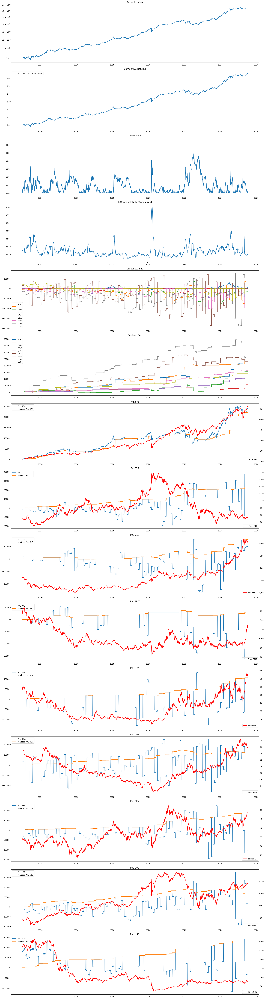

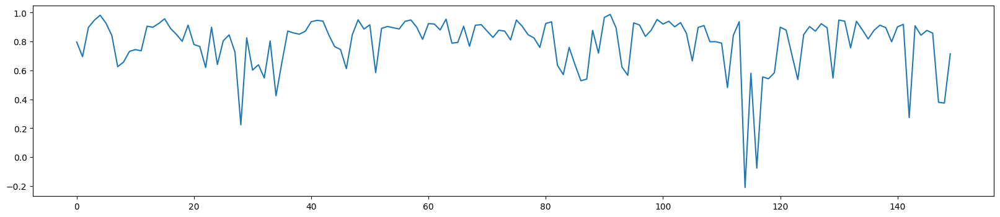

In [20]:
tickers_in_backtest = [
    'SPY', 
    'TLT', 
    'GLD', 
    'PPLT', 
    'URA', 
    'DBA', 
    'EEM',
    'LQD', 
    # 'IBIT',
    'USO',
]


ret_model_perf_tracker = []
vol_model_perf_tracker = []
leverage_tracker = []

# Price data
trading_price_data = {f: price_data[f].copy() for f in tickers_in_backtest}
start_date = pd.to_datetime('2013-01-01')
for ticker in trading_price_data:
    df = trading_price_data[ticker]
    df = df.loc[df.index >= start_date]
    trading_price_data[ticker] = df

# Trading data
trading_data = dict()
for ticker in tickers_in_backtest:
    trading_data[ticker] = risky_assets[ticker]['data']


btr = BackTester(trading_price_data)
btr.add_strategy(
    MultiAssetStrategy,
    tickers=tickers_in_backtest,
    price_data=trading_price_data,
    rebalance_period=rebalance_period,
    lookback_periods=lookback_periods,
    dict_data=trading_data.copy(),
    covariance_matrix_lookback=covariance_matrix_lookback,
    historical_period=historical_lookback_period,
)
results = btr.backtest()

for key in results:
    if key == 'returns': continue
    print(f"{key}: {results[key]:.2f}")

print(f'Mean leverage: {np.mean(leverage_tracker):.2f}')



btr.plot_results()

plt.figure(figsize=(20, 4))
plt.plot(leverage_tracker, label='Leverage')
plt.show()




## END

# LIVE TRADING

## Calculate Positions

-------------------------------------------------------
SPY 2025-04-29T00:00:00.000000000 2025-07-11T00:00:00.000000000
vol_scaling_factor: 0.687


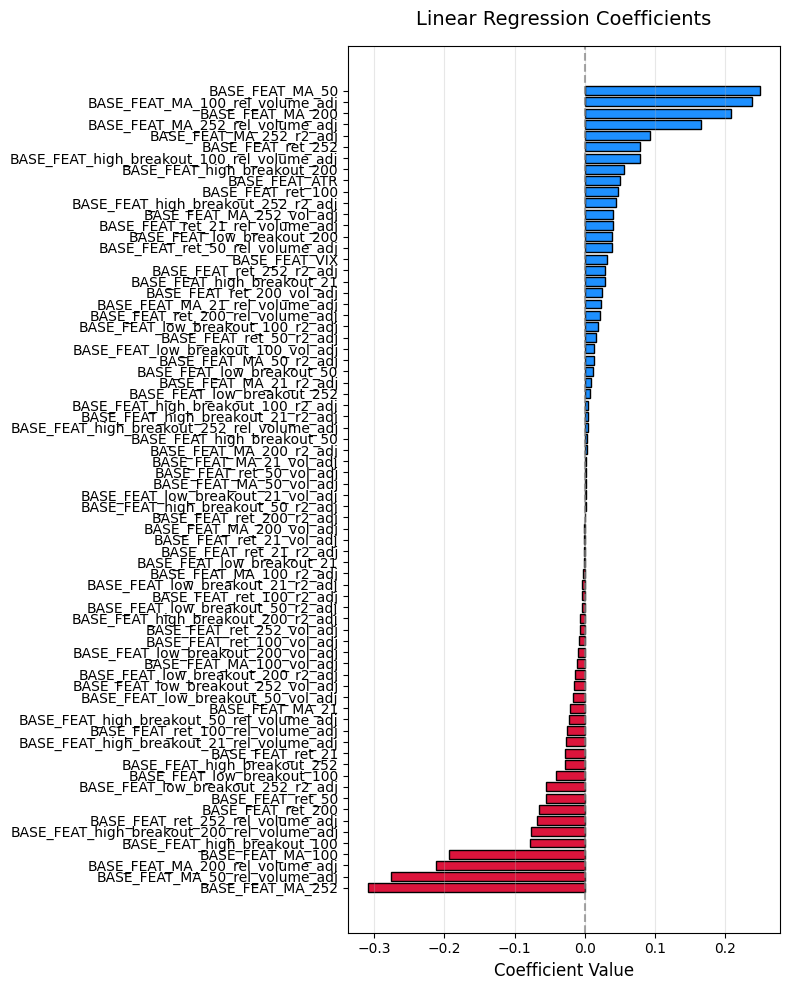

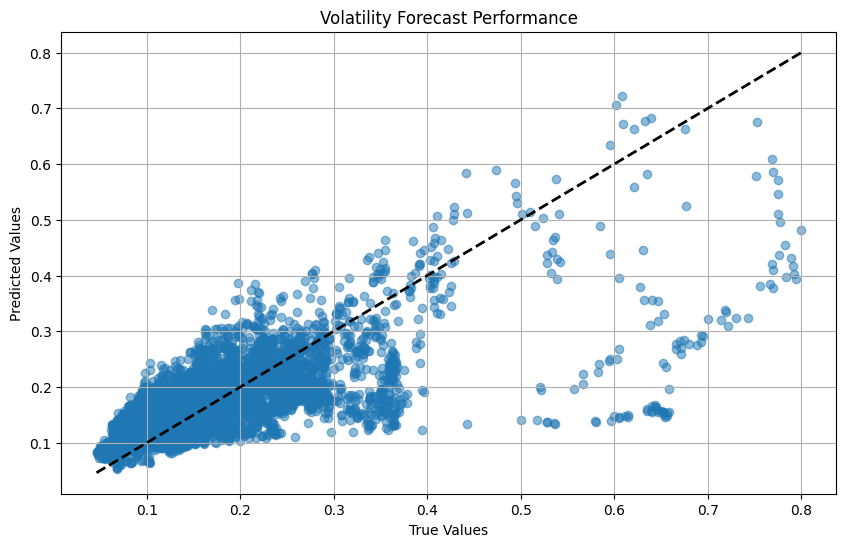

pct_rank: 0.615
ret_scaling_factor: 0.738
Training:       59.84%, 101.60%, 138.18%
ret forecast:   104.07%, Annualized: 22.26%


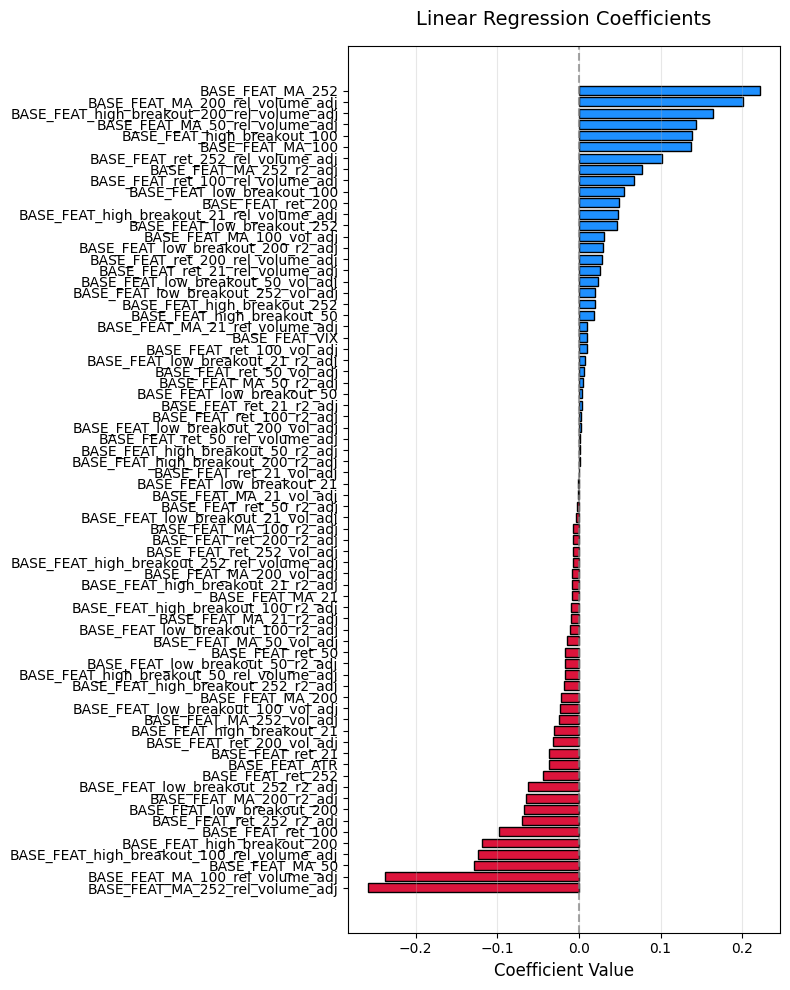

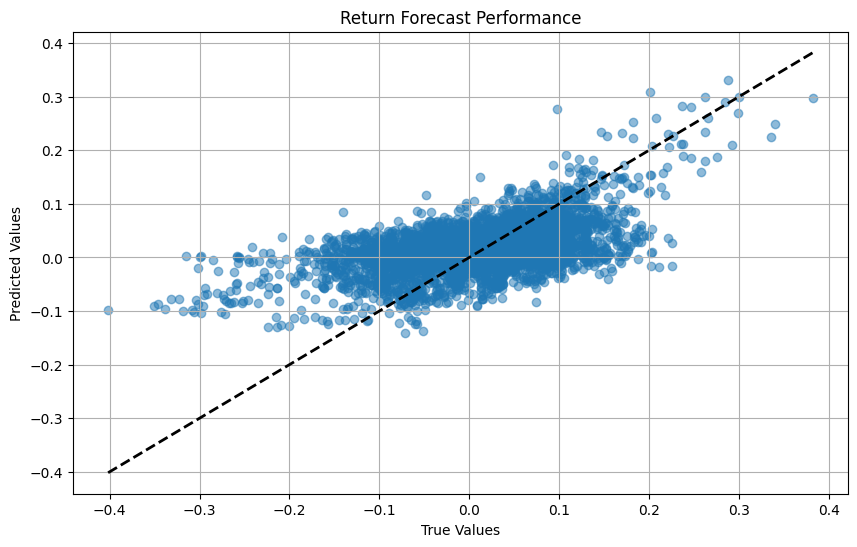

constrained_ret_scaling_factor: 0.319


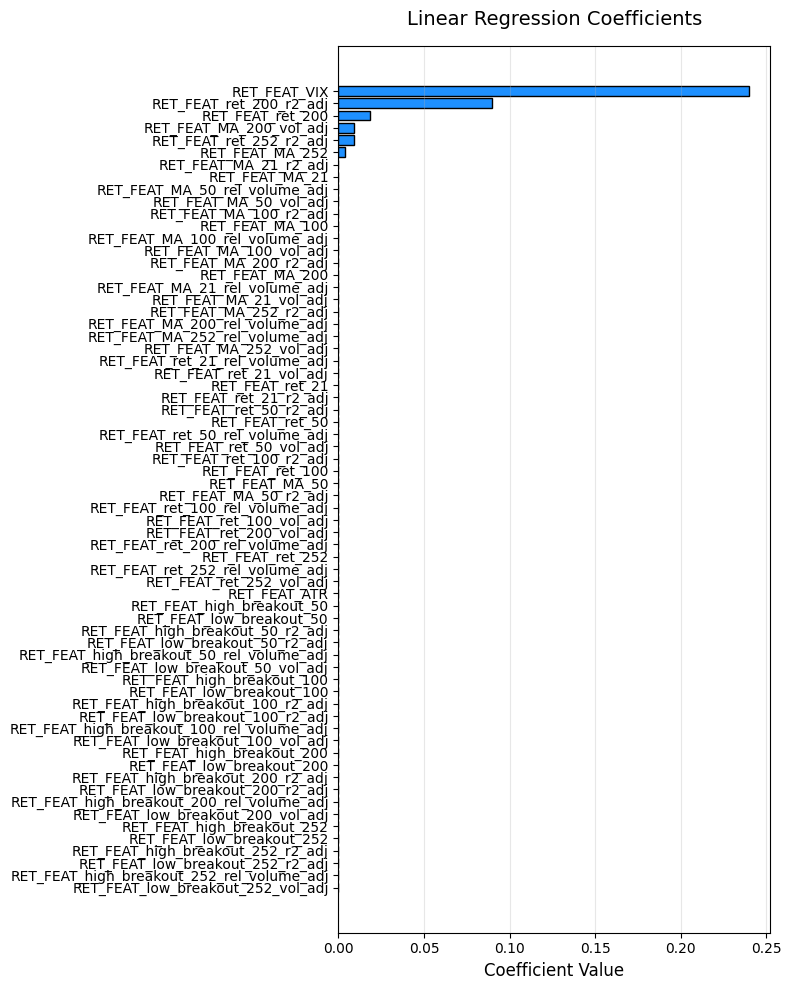

unconstrained_ret_scaling_factor: 0.738
constrained_ret_scaling_factor: 0.319
final_ret_scaling_factor: 0.529
vol_scaling_factor: 0.687
ret_scaling_factor: 0.529
scaling_factor: 0.6024673974585066
-------------------------------------------------------
GLD 2025-04-29T00:00:00.000000000 2025-07-11T00:00:00.000000000
vol_scaling_factor: 0.215


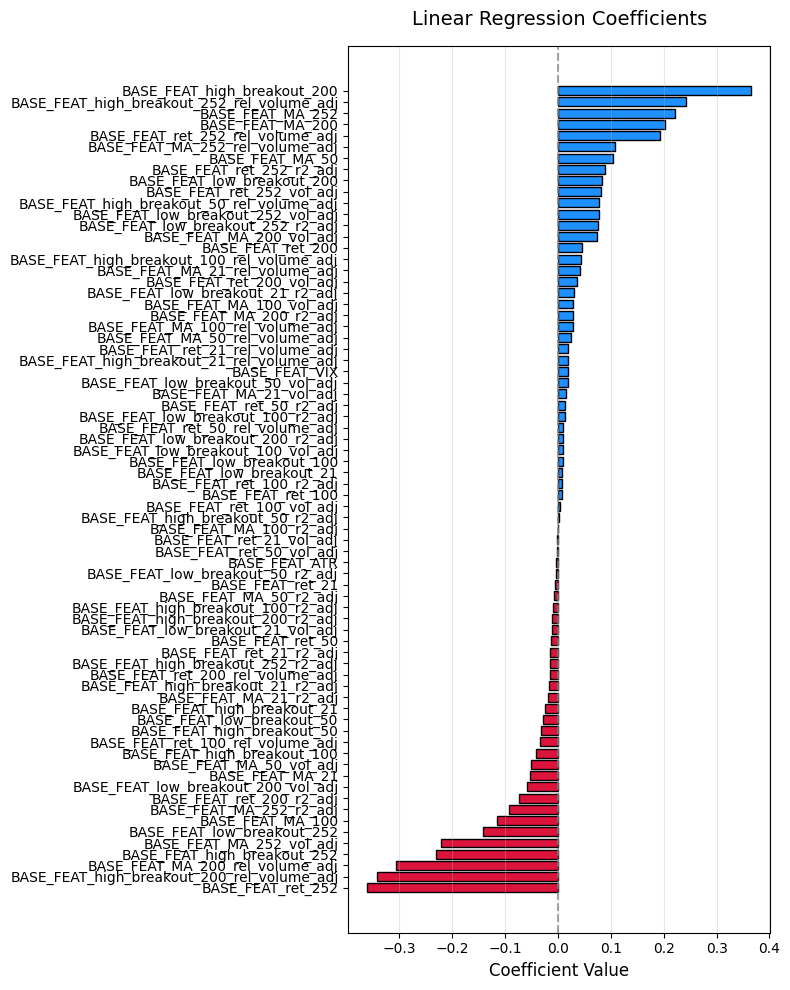

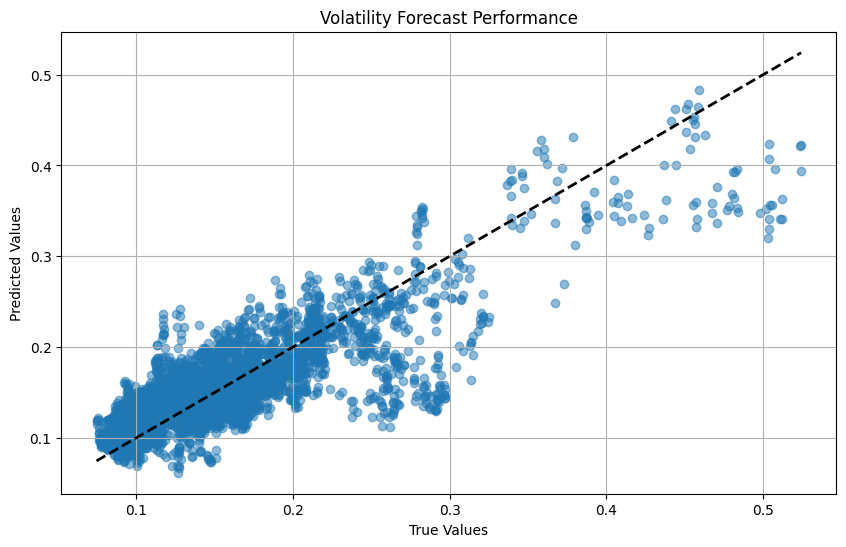

pct_rank: 0.853
ret_scaling_factor: 1.000
Training:       78.44%, 101.43%, 130.05%
ret forecast:   109.05%, Annualized: 54.73%


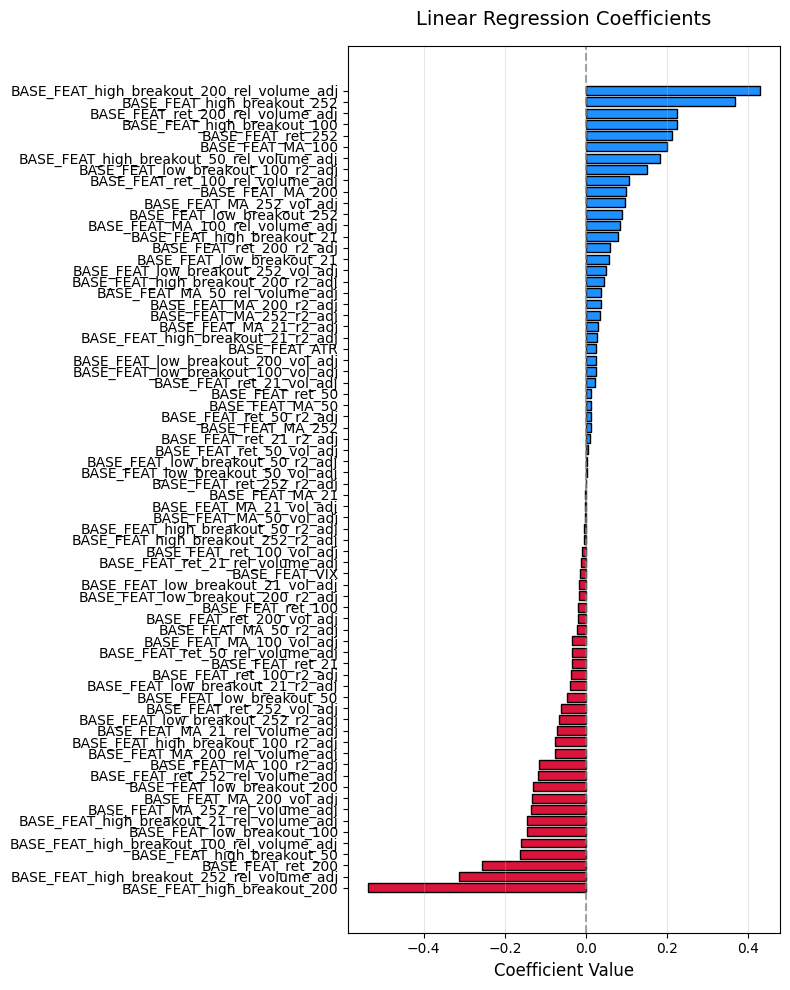

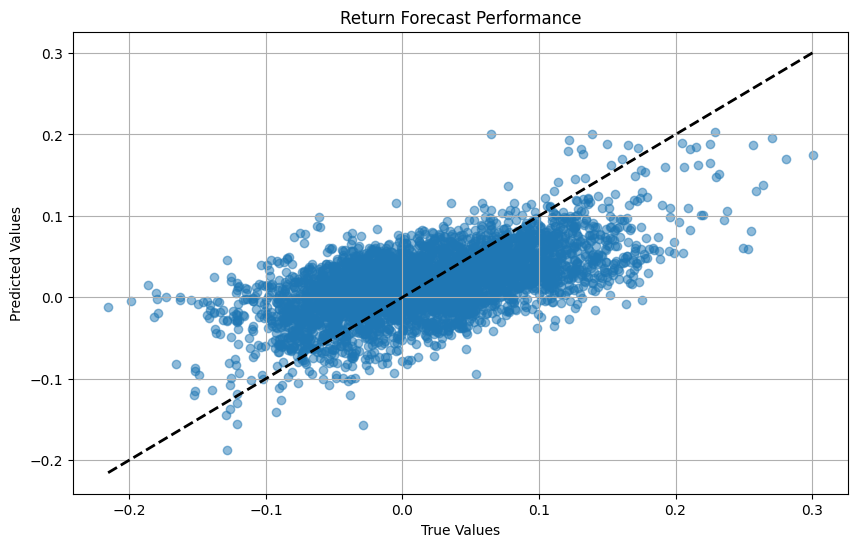

constrained_ret_scaling_factor: 0.300


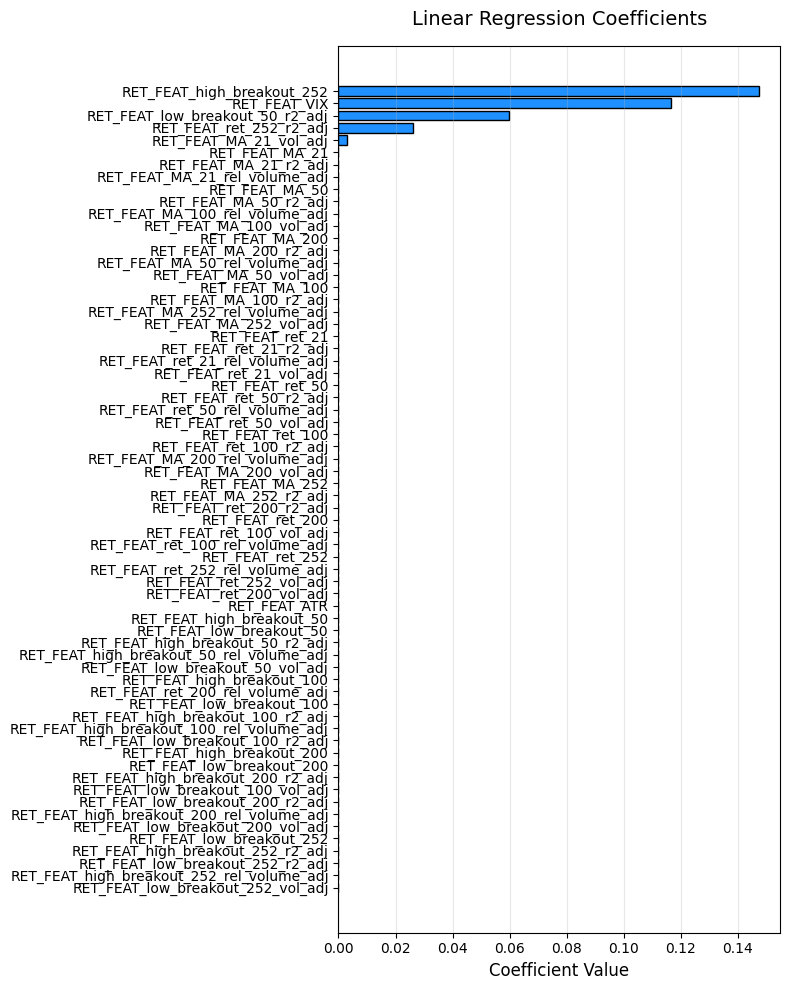

unconstrained_ret_scaling_factor: 1.000
constrained_ret_scaling_factor: 0.300
final_ret_scaling_factor: 0.650
vol_scaling_factor: 0.215
ret_scaling_factor: 0.650
scaling_factor: 0.3737717677428194
-------------------------------------------------------
PPLT 2025-04-29T00:00:00.000000000 2025-07-11T00:00:00.000000000
vol_scaling_factor: 0.100


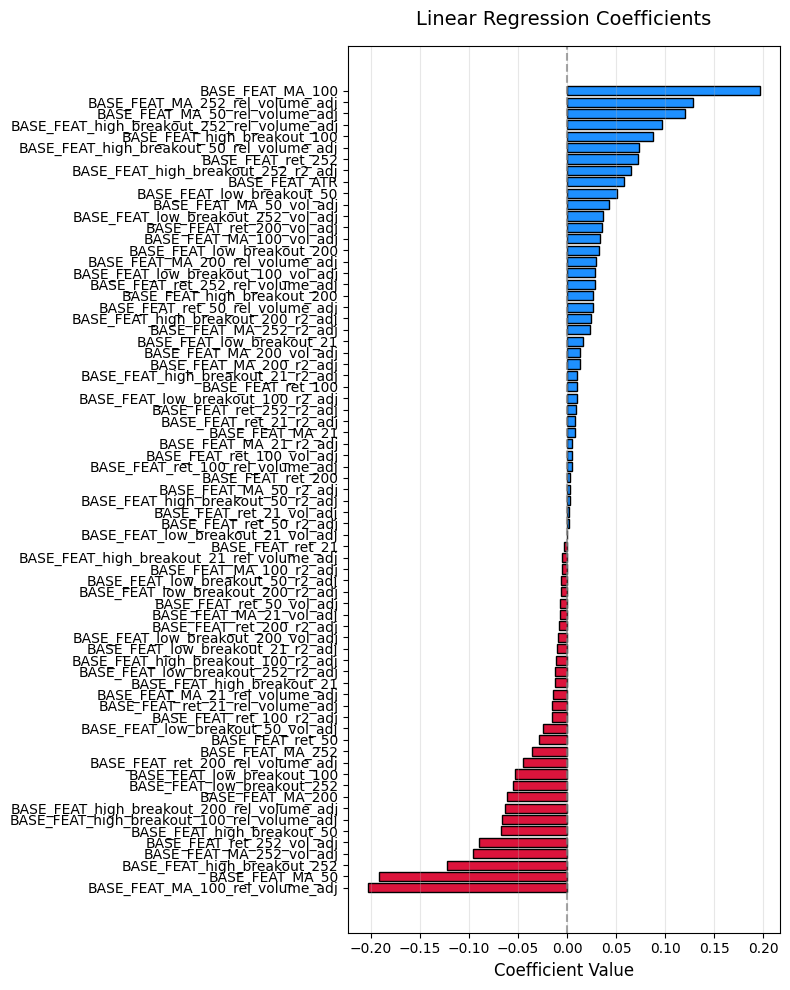

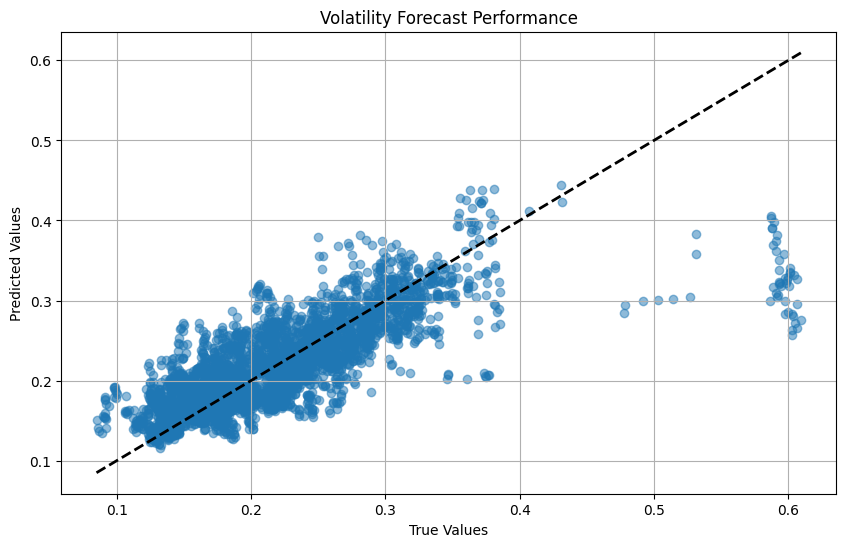

ret_scaling_factor: -0.050
Training:       61.40%, 99.28%, 148.57%
ret forecast:   62.42%, Annualized: -90.70%


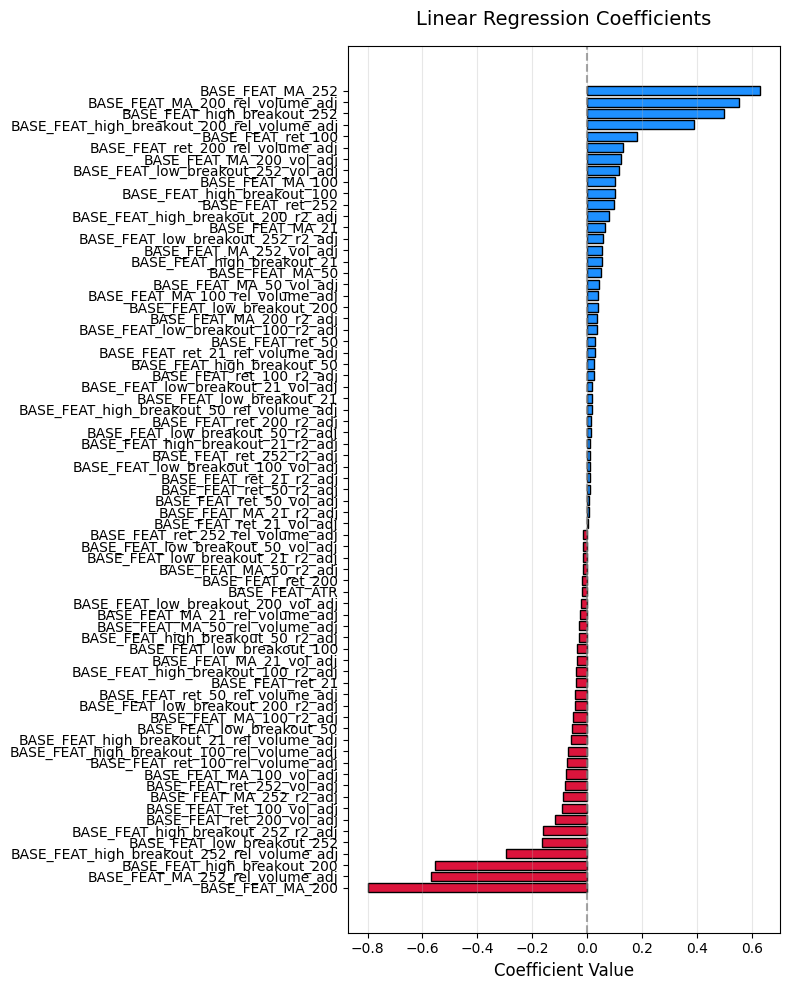

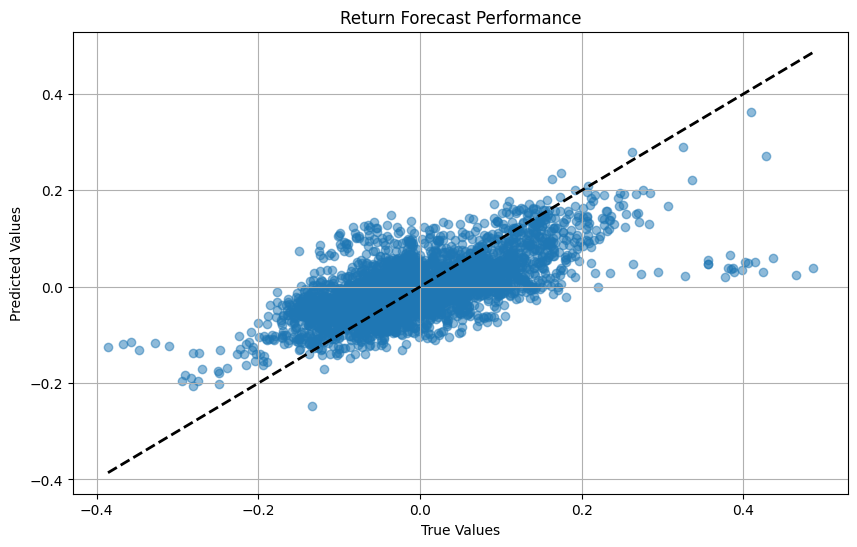

constrained_ret_scaling_factor: 0.000


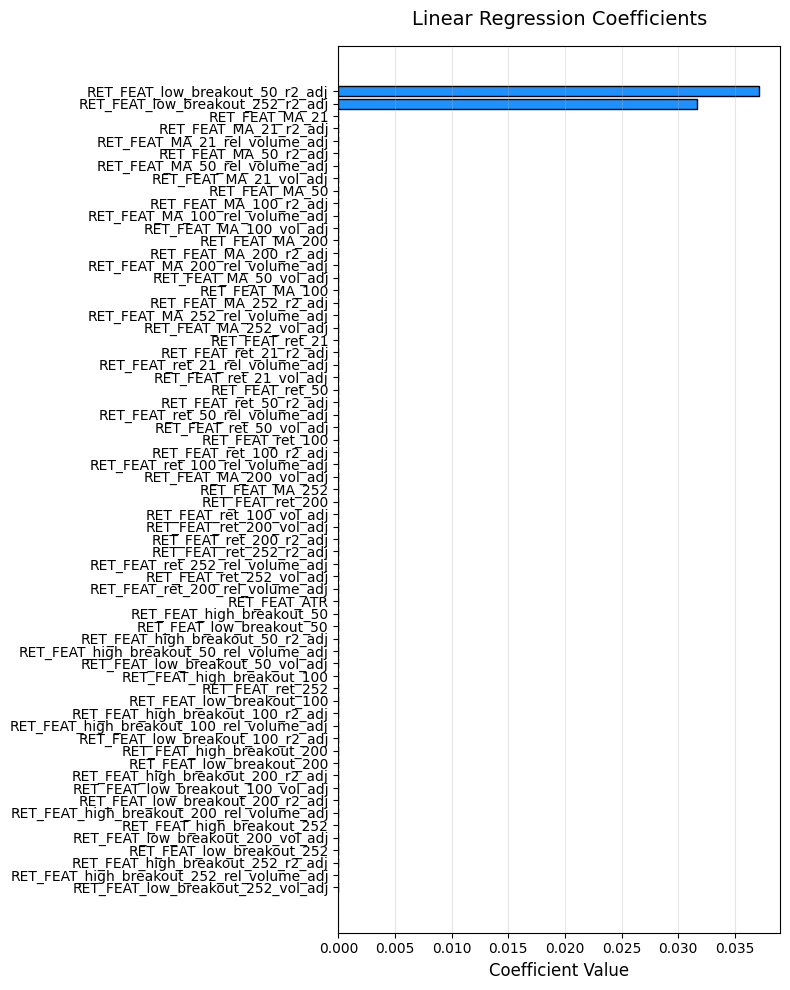

unconstrained_ret_scaling_factor: -0.050
constrained_ret_scaling_factor: 0.000
final_ret_scaling_factor: -0.025
vol_scaling_factor: 0.100
ret_scaling_factor: -0.025
scaling_factor: -0.05000000000000001
-------------------------------------------------------
URA 2025-04-29T00:00:00.000000000 2025-07-11T00:00:00.000000000
vol_scaling_factor: 0.440


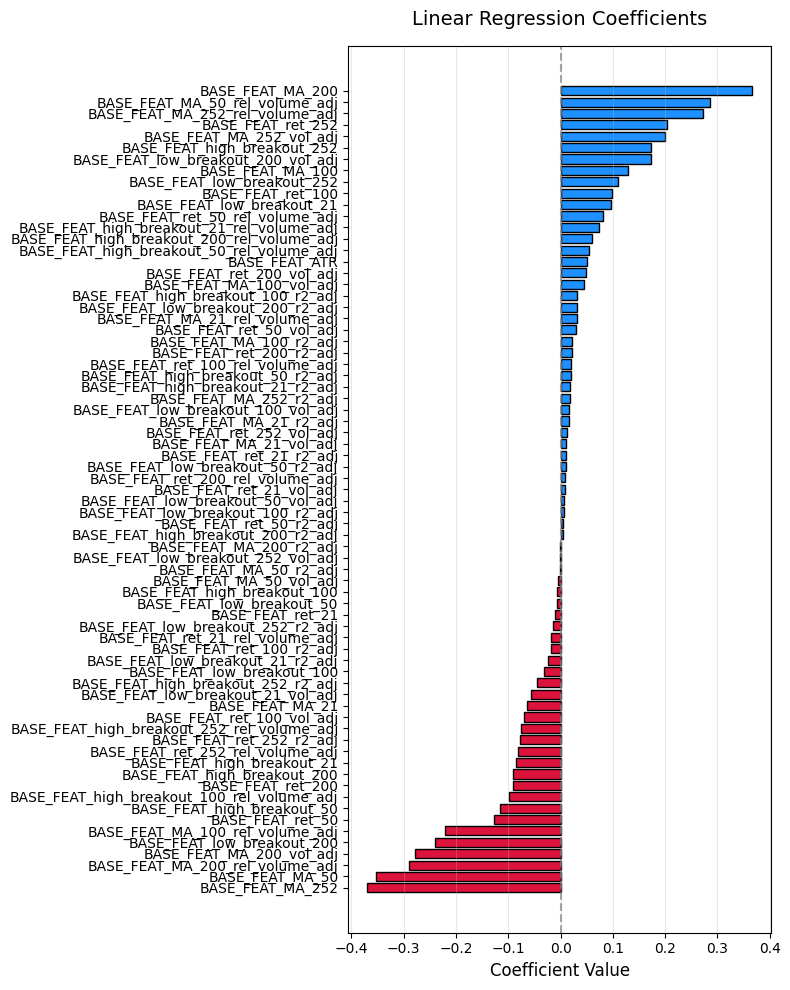

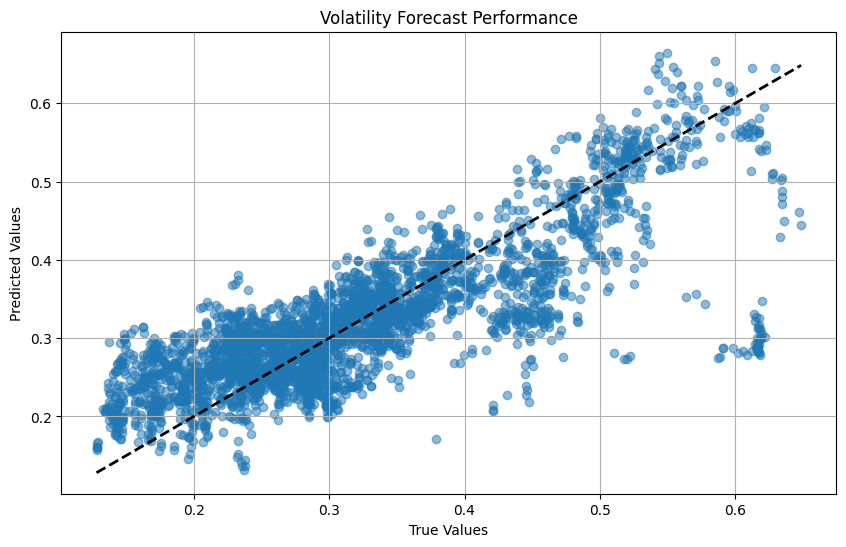

ret_scaling_factor: -0.050
Training:       64.87%, 99.32%, 186.43%
ret forecast:   64.09%, Annualized: -89.37%


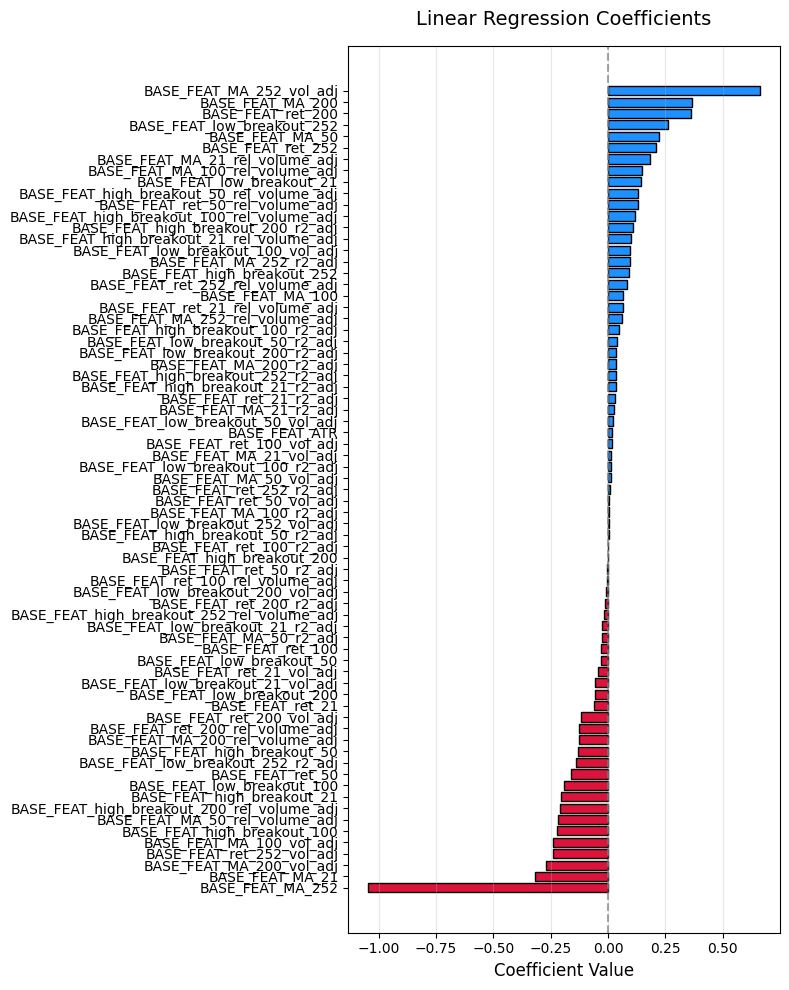

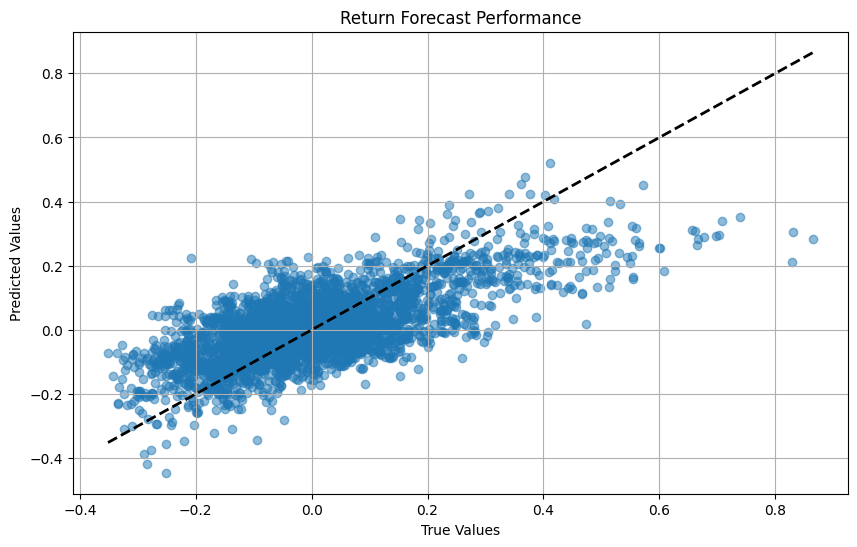

constrained_ret_scaling_factor: 0.001


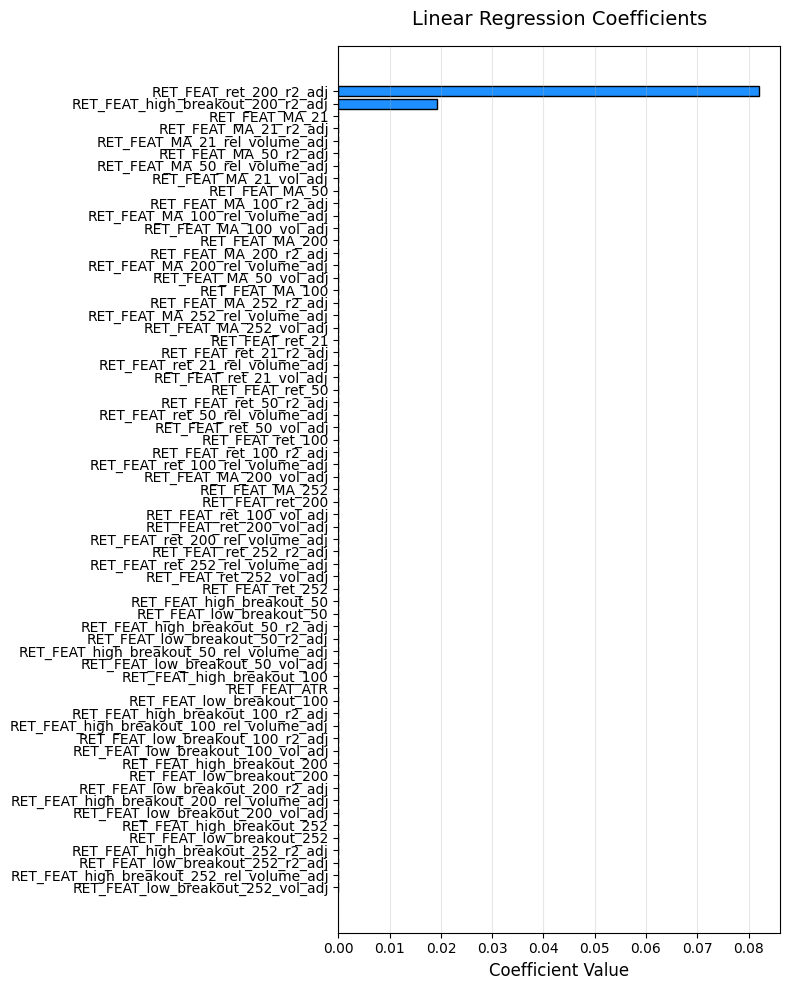

unconstrained_ret_scaling_factor: -0.050
constrained_ret_scaling_factor: 0.001
final_ret_scaling_factor: -0.025
vol_scaling_factor: 0.440
ret_scaling_factor: -0.025
scaling_factor: -0.10389598677818125
-------------------------------------------------------
DBA 2025-04-29T00:00:00.000000000 2025-07-11T00:00:00.000000000
vol_scaling_factor: 0.519


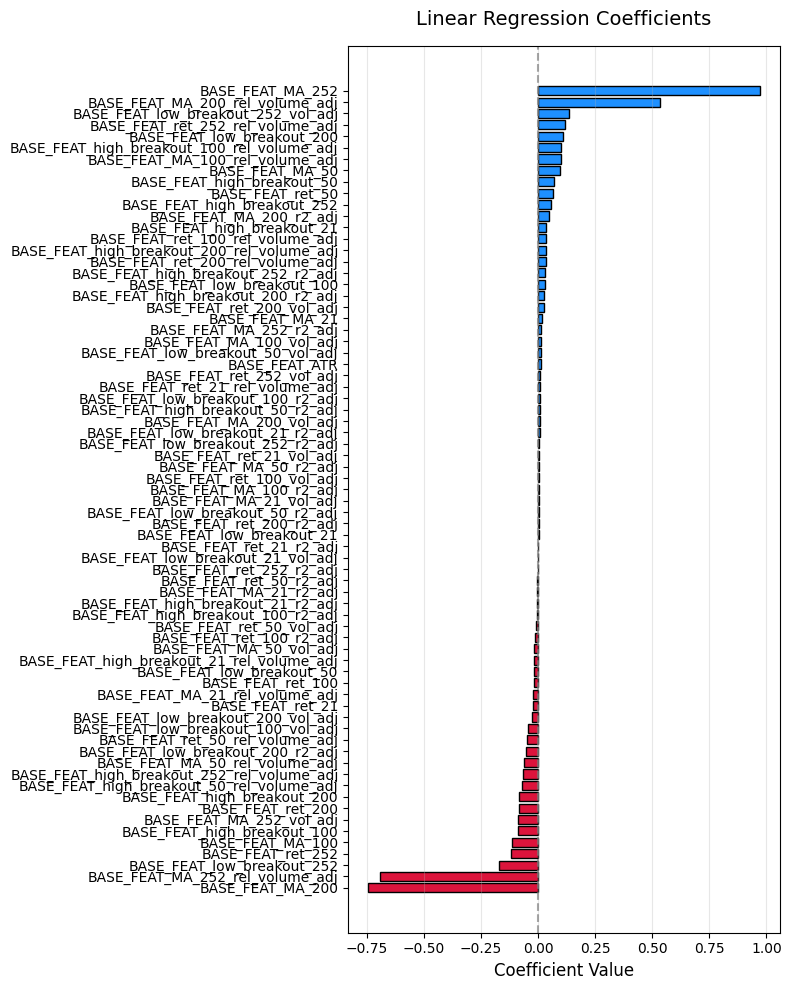

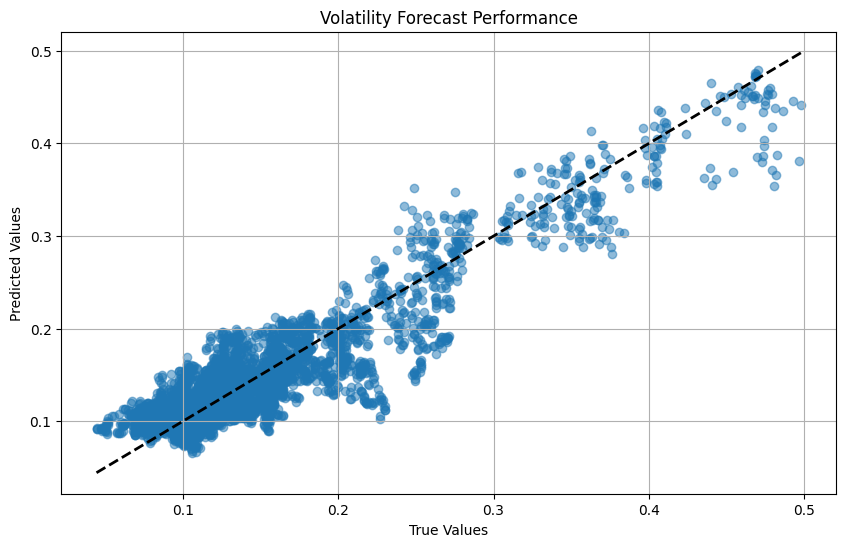

ret_scaling_factor: -0.050
Training:       67.35%, 99.59%, 120.69%
ret forecast:   99.94%, Annualized: -0.29%


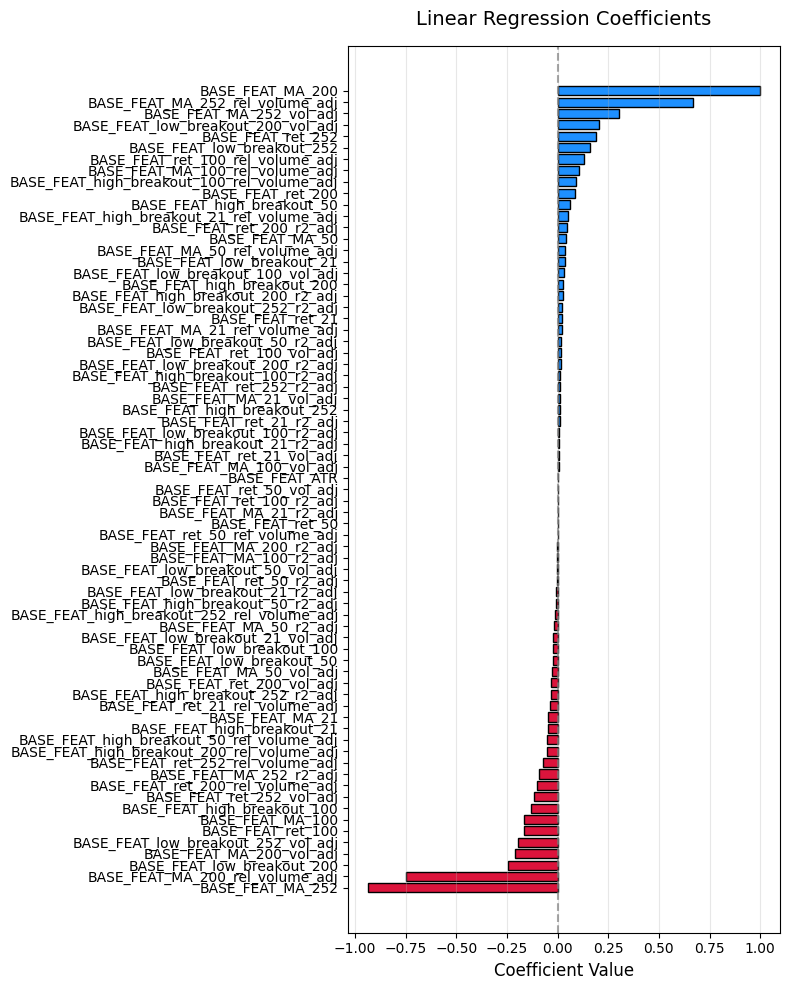

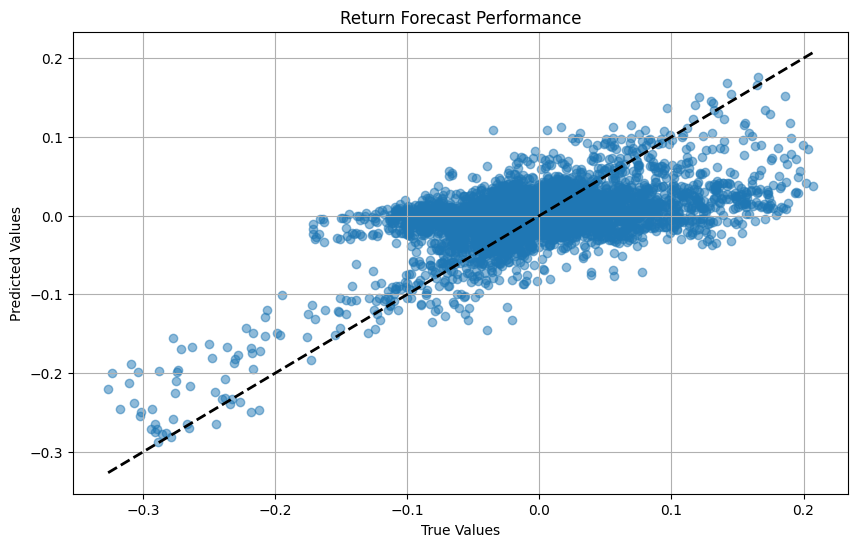

constrained_ret_scaling_factor: -0.050


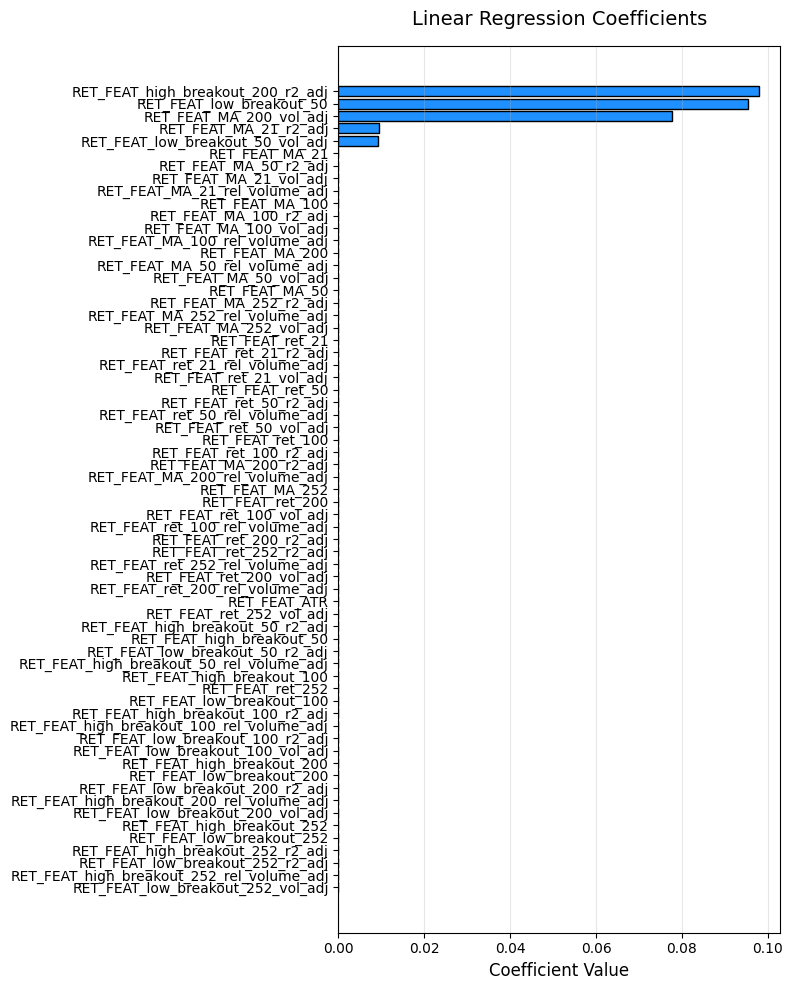

unconstrained_ret_scaling_factor: -0.050
constrained_ret_scaling_factor: -0.050
final_ret_scaling_factor: -0.050
vol_scaling_factor: 0.519
ret_scaling_factor: -0.050
scaling_factor: -0.1610628153444644
-------------------------------------------------------
EEM 2025-04-29T00:00:00.000000000 2025-07-11T00:00:00.000000000
vol_scaling_factor: 0.891


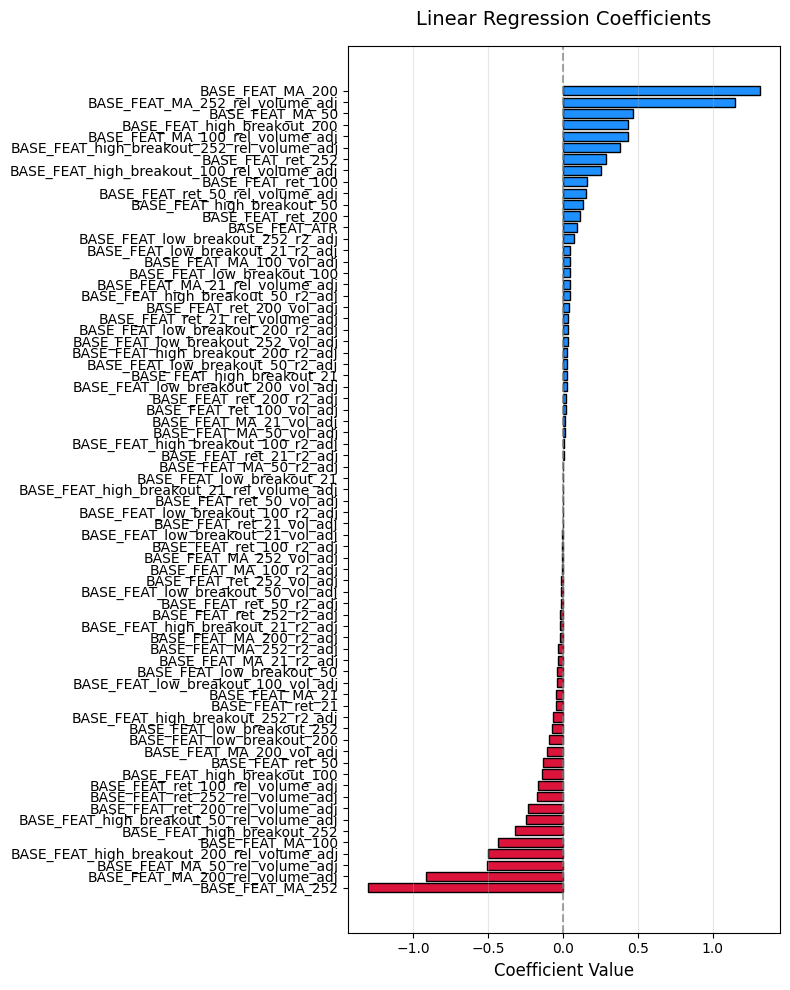

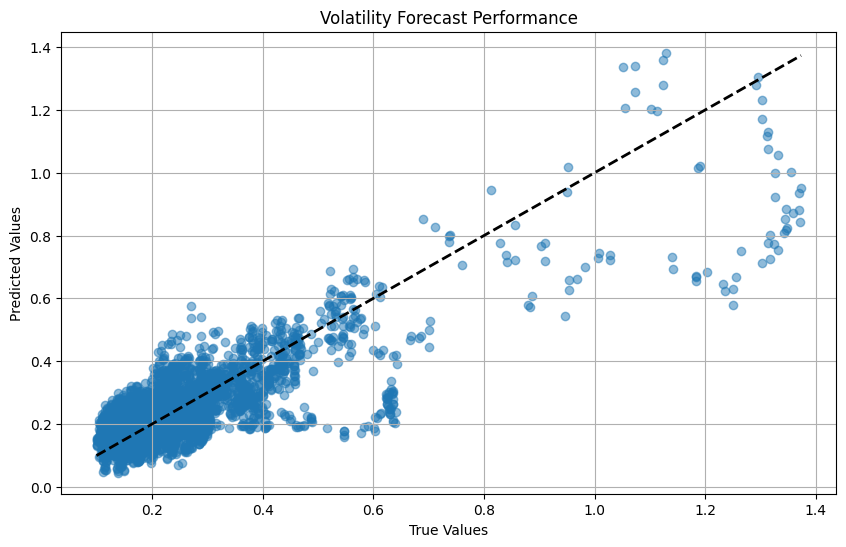

pct_rank: 0.550
ret_scaling_factor: 0.661
Training:       48.75%, 100.90%, 154.71%
ret forecast:   103.22%, Annualized: 17.31%


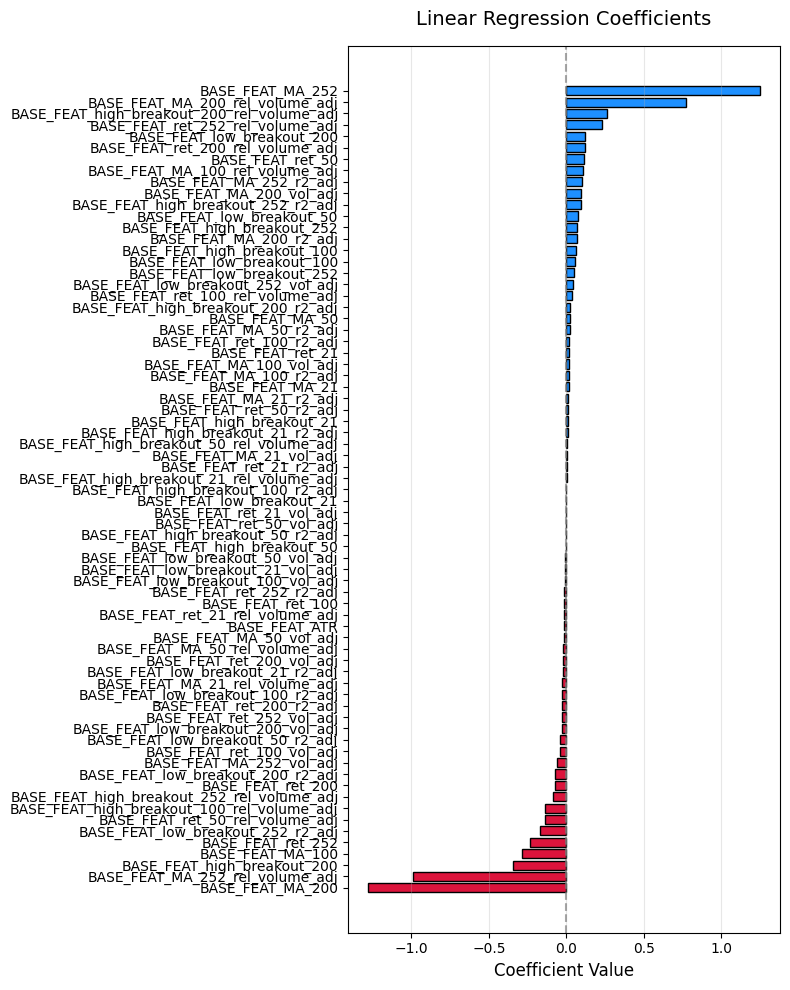

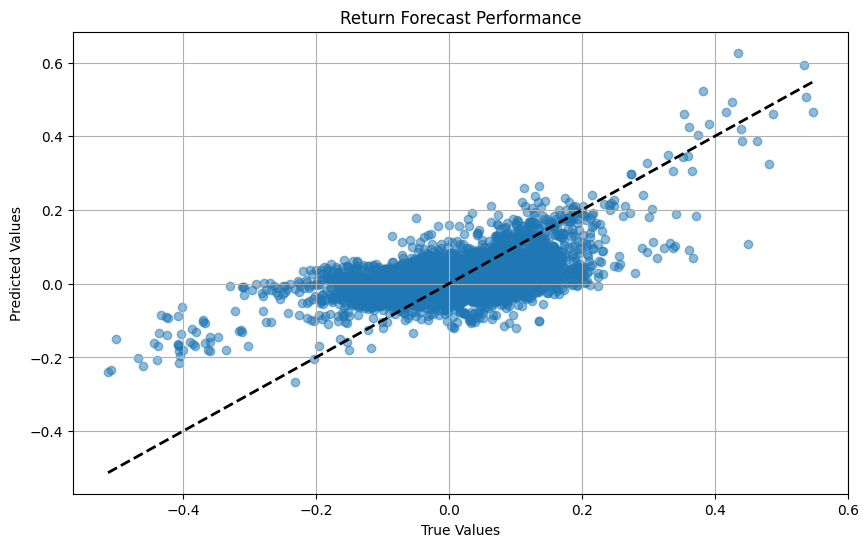

constrained_ret_scaling_factor: 0.313


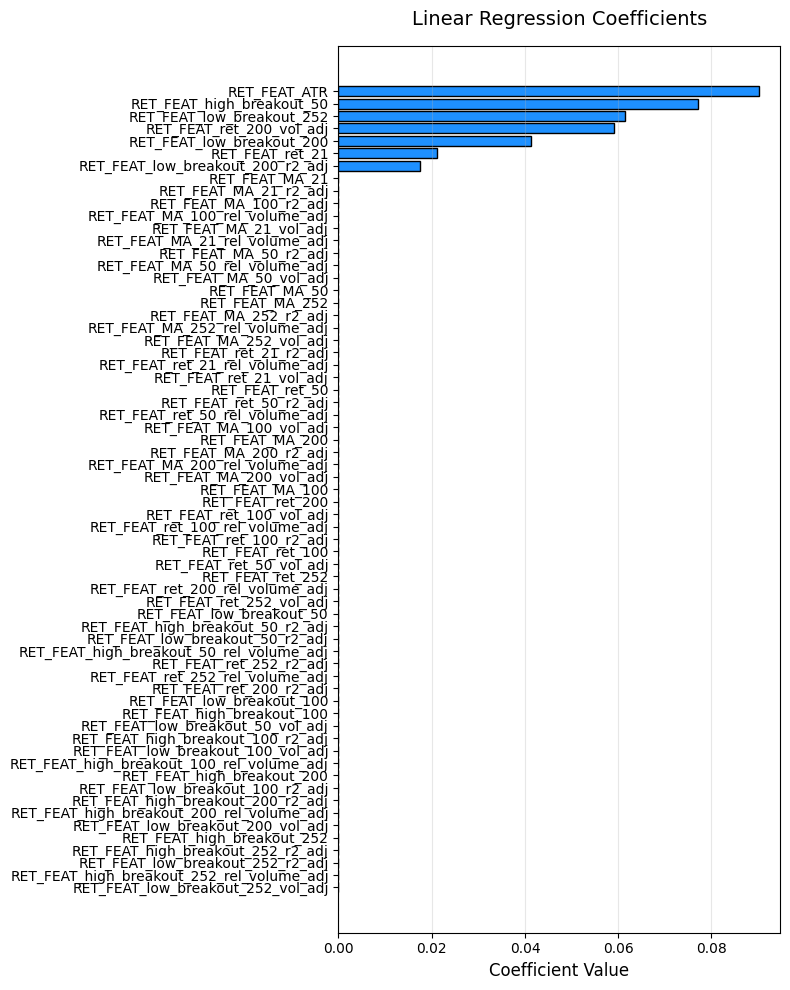

unconstrained_ret_scaling_factor: 0.661
constrained_ret_scaling_factor: 0.313
final_ret_scaling_factor: 0.487
vol_scaling_factor: 0.891
ret_scaling_factor: 0.487
scaling_factor: 0.6583091830424428
-------------------------------------------------------
LQD 2025-04-29T00:00:00.000000000 2025-07-11T00:00:00.000000000
vol_scaling_factor: 0.303


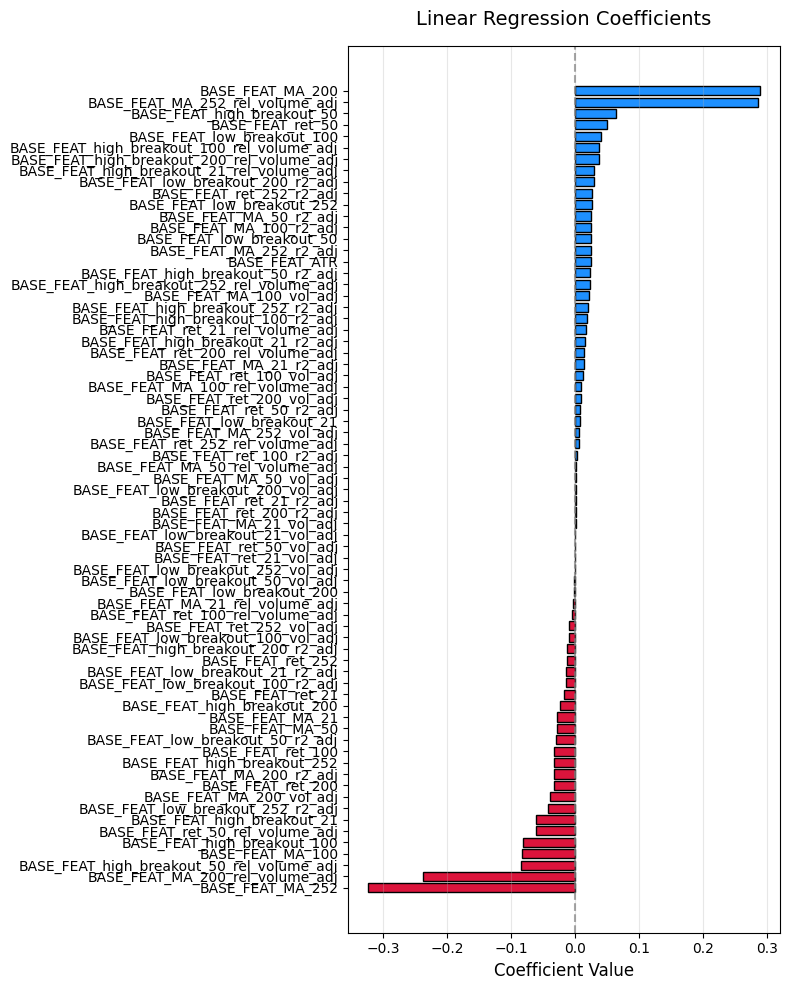

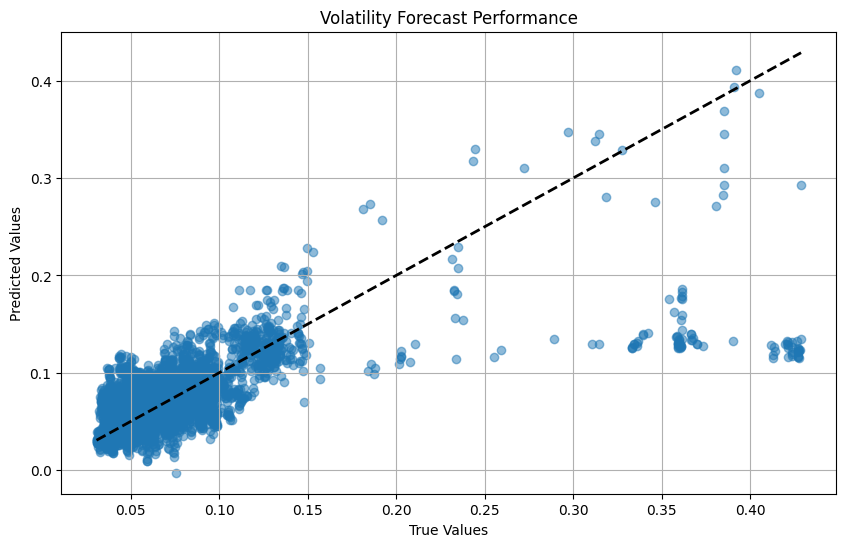

pct_rank: 0.678
ret_scaling_factor: 0.814
Training:       81.27%, 99.99%, 125.67%
ret forecast:   101.32%, Annualized: 6.84%


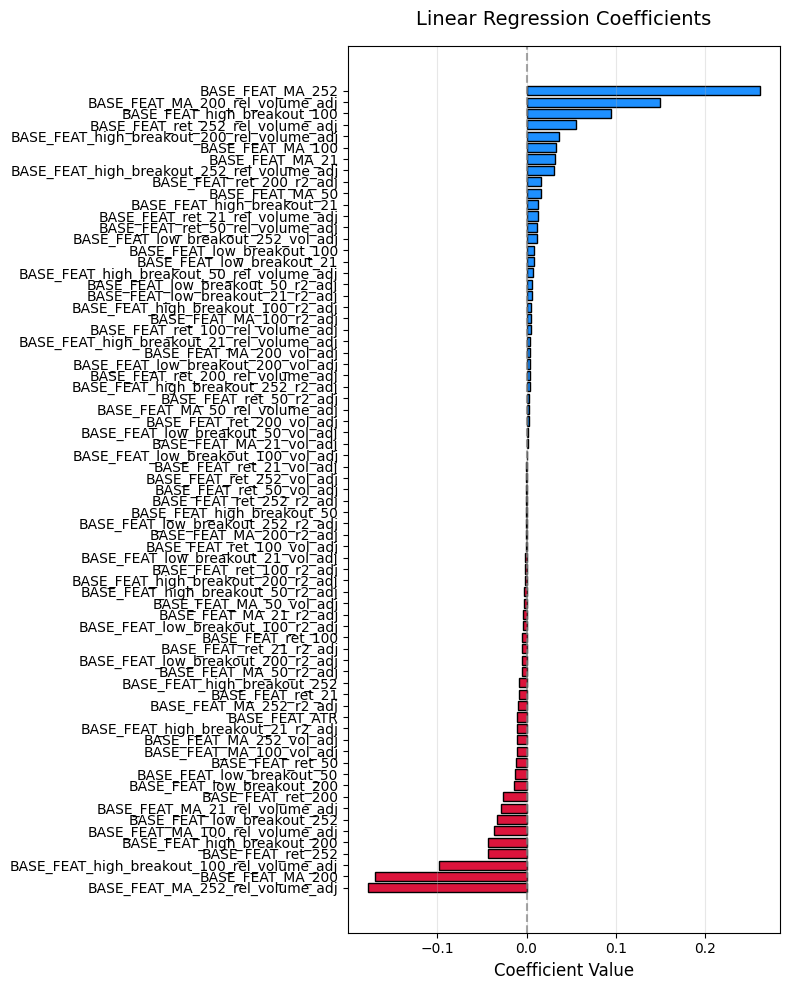

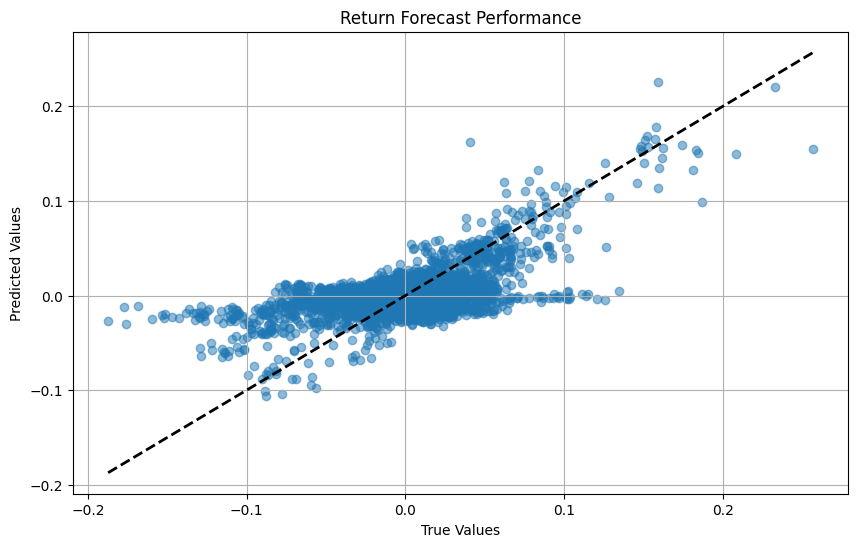

constrained_ret_scaling_factor: 0.106


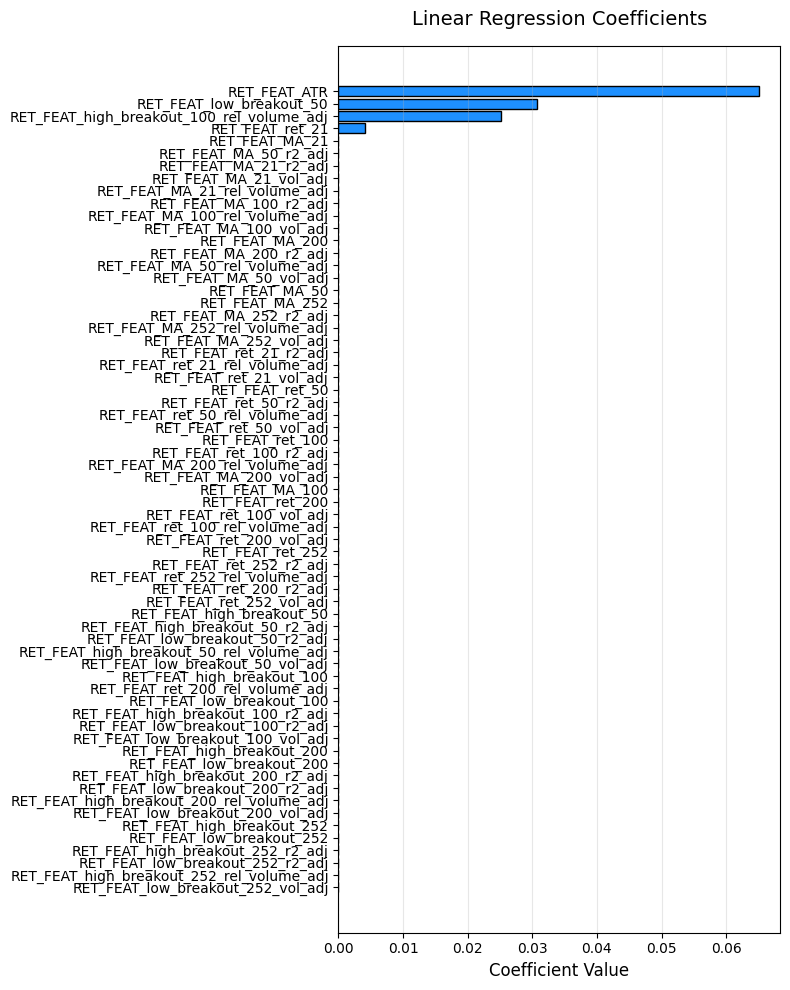

unconstrained_ret_scaling_factor: 0.814
constrained_ret_scaling_factor: 0.106
final_ret_scaling_factor: 0.460
vol_scaling_factor: 0.303
ret_scaling_factor: 0.460
scaling_factor: 0.37351524908698874
-------------------------------------------------------
IBIT 2025-04-29T00:00:00.000000000 2025-07-11T00:00:00.000000000
vol_scaling_factor: 1.000


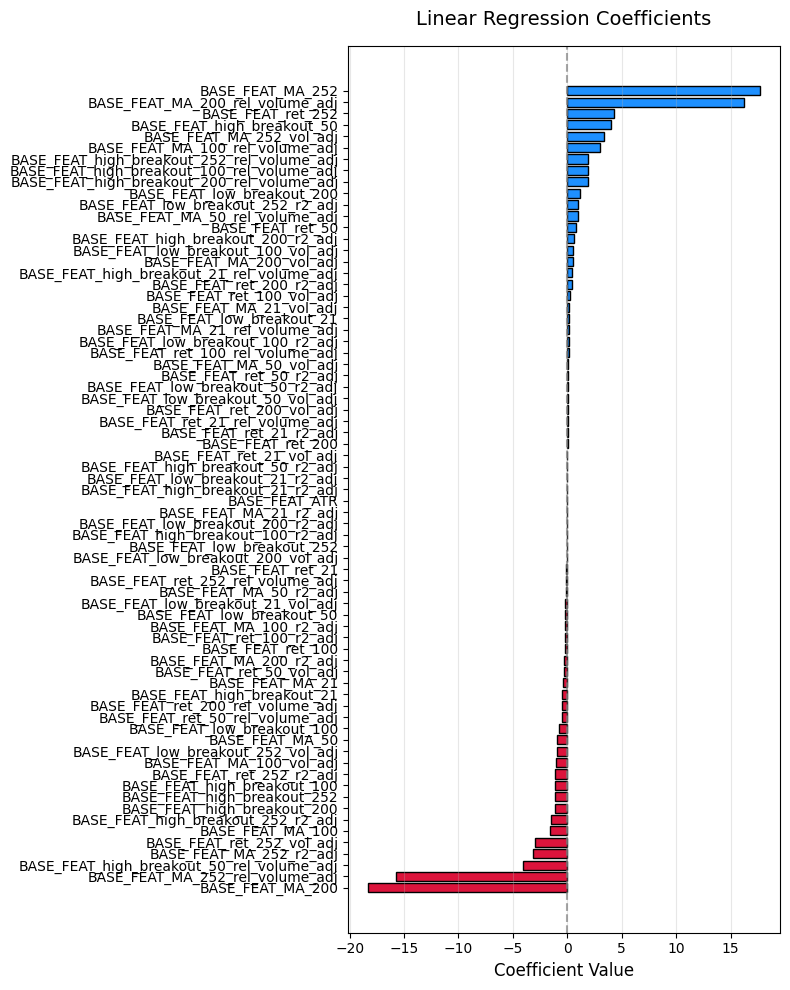

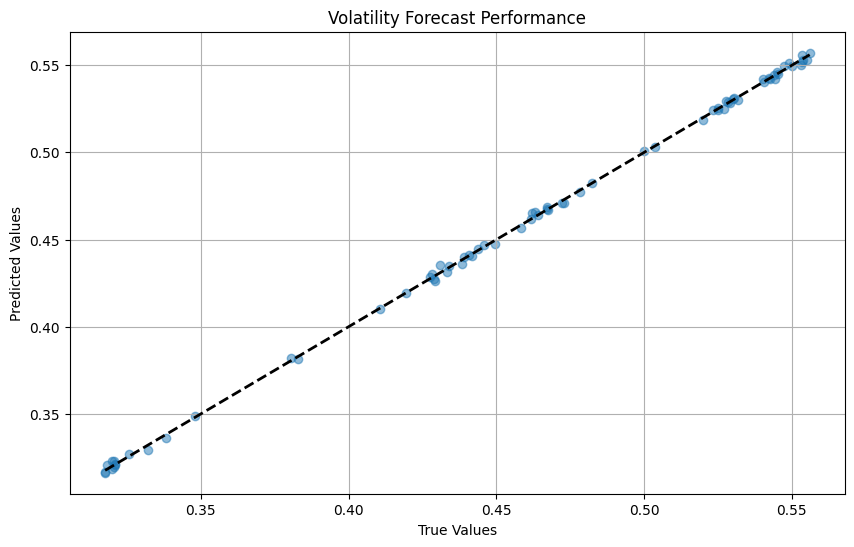

pct_rank: 1.000
ret_scaling_factor: 1.000
Training:       75.64%, 108.81%, 138.91%
ret forecast:   256.36%, Annualized: 11397.89%


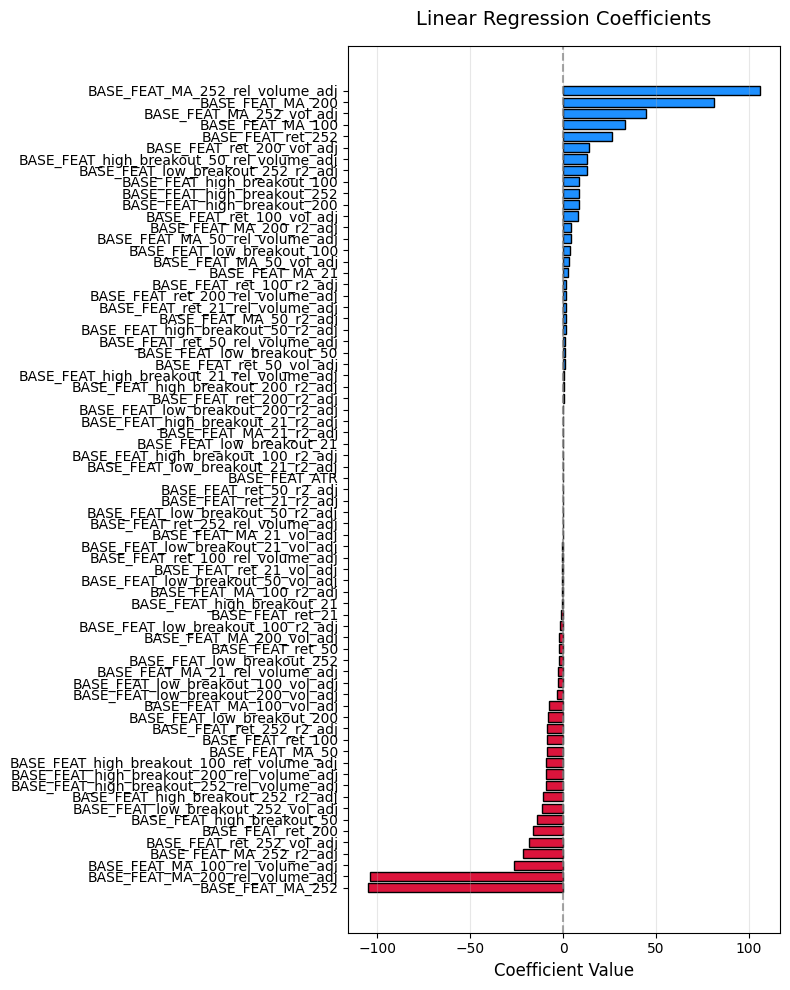

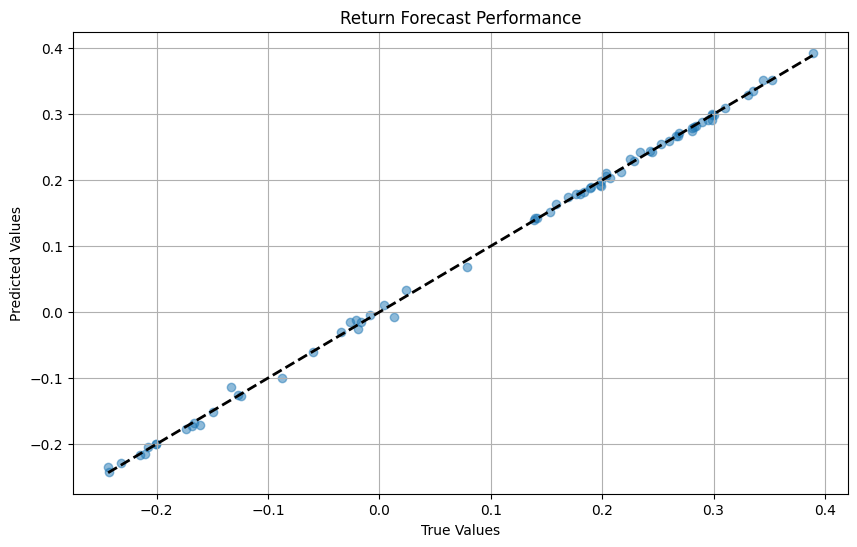

constrained_ret_scaling_factor: 0.394


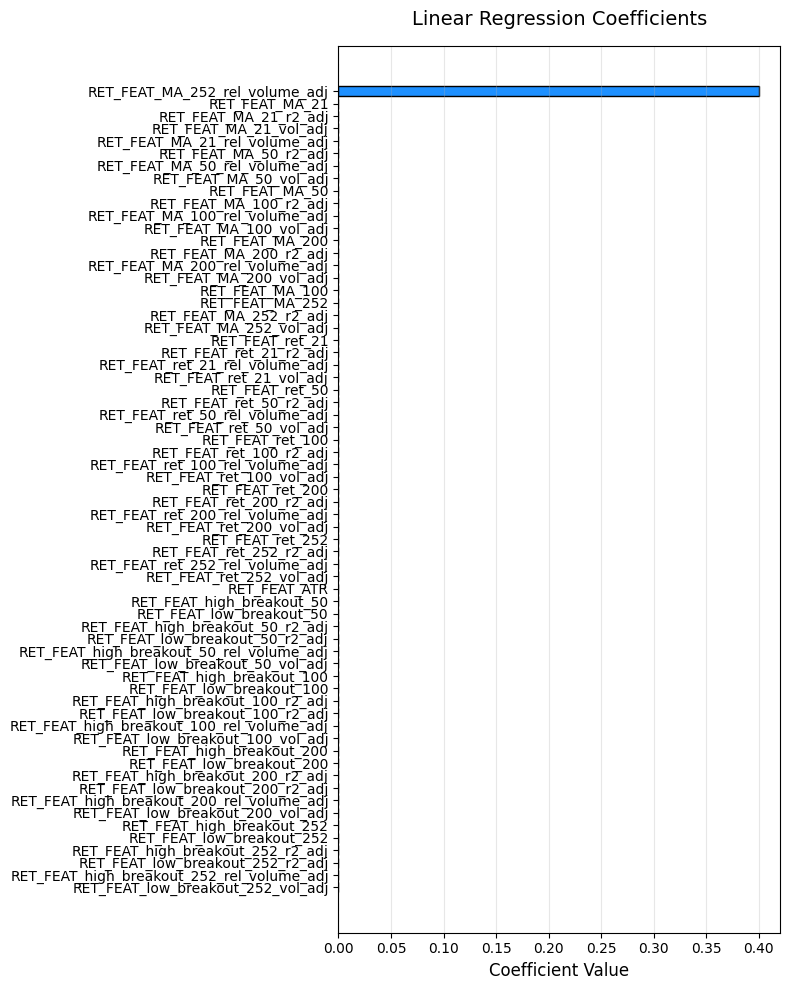

unconstrained_ret_scaling_factor: 1.000
constrained_ret_scaling_factor: 0.394
final_ret_scaling_factor: 0.697
vol_scaling_factor: 1.000
ret_scaling_factor: 0.697
scaling_factor: 0.8350105282008549
-------------------------------------------------------
USO 2025-04-29T00:00:00.000000000 2025-07-11T00:00:00.000000000
vol_scaling_factor: 0.459


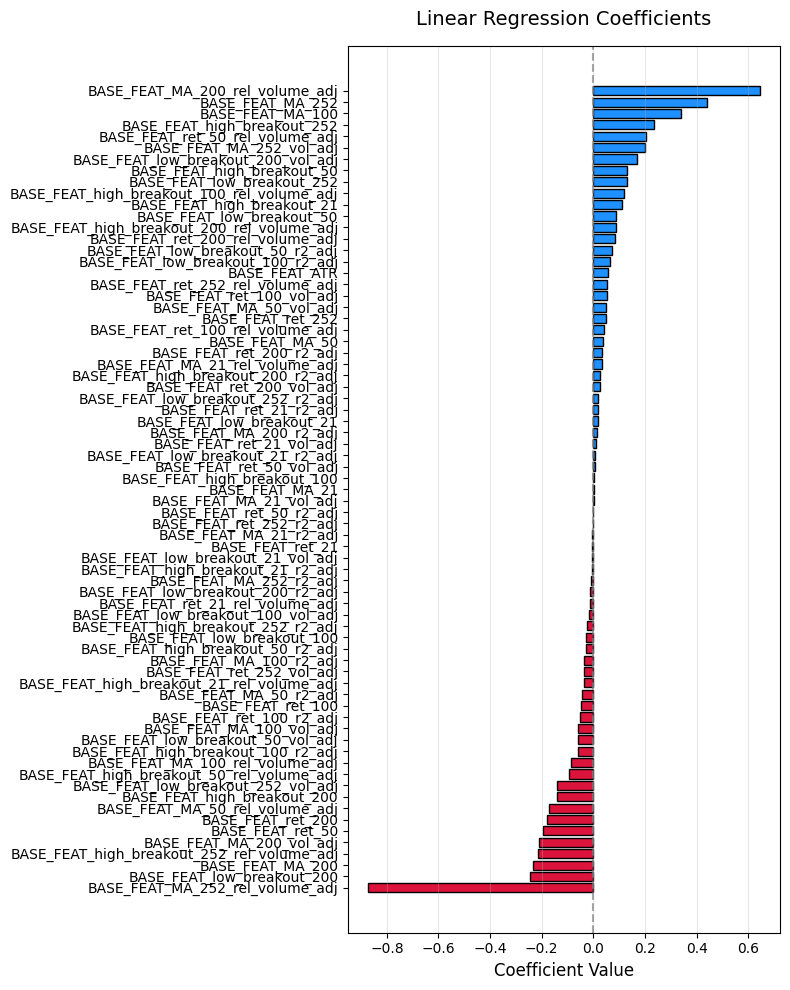

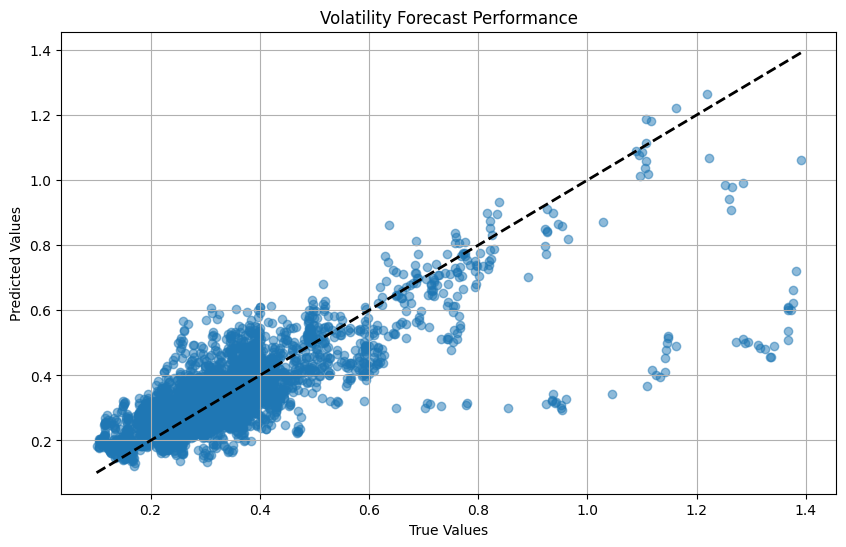

pct_rank: 0.883
ret_scaling_factor: 1.000
Training:       19.45%, 98.15%, 171.24%
ret forecast:   116.48%, Annualized: 115.72%


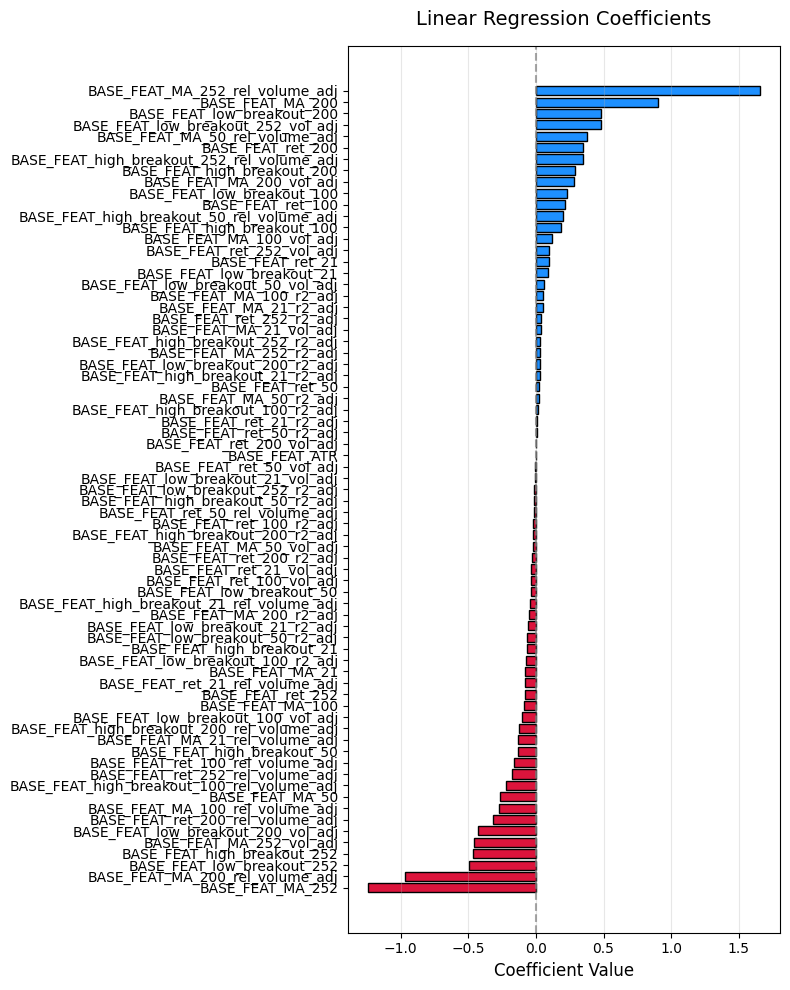

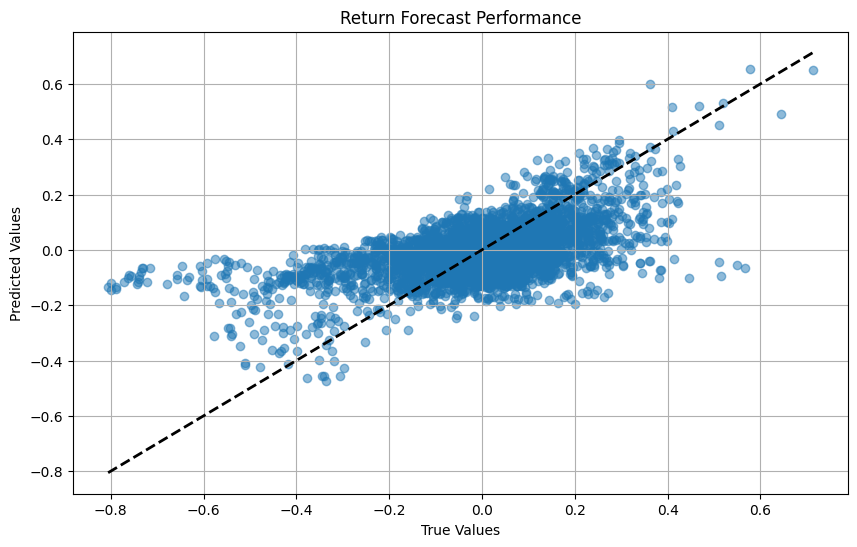

constrained_ret_scaling_factor: 0.061


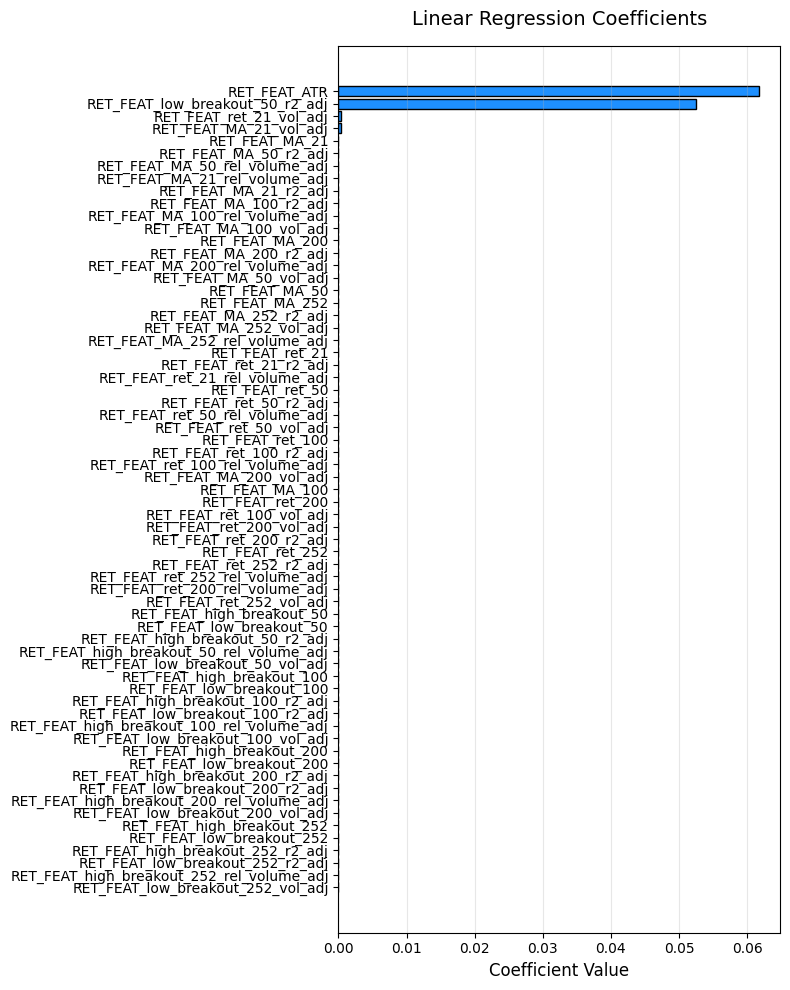

unconstrained_ret_scaling_factor: 1.000
constrained_ret_scaling_factor: 0.061
final_ret_scaling_factor: 0.530
vol_scaling_factor: 0.459
ret_scaling_factor: 0.530
scaling_factor: 0.49345559381122805
------------------------------------------------------------------------
SPY
Current date:           2025-07-11 00:00:00
Allocation:             8.85%
Capital allocated:     $9896.99
shares to buy:          15 = $9896.99 / $623.62
------------------------------------------------------------------------
GLD
Current date:           2025-07-11 00:00:00
Allocation:             5.43%
Capital allocated:     $6075.61
shares to buy:          19 = $6075.61 / $309.14
------------------------------------------------------------------------
PPLT
Current date:           2025-07-11 00:00:00
Allocation:             0.00%
Capital allocated:     $0.00
shares to buy:          0 = $0.00 / $128.20
------------------------------------------------------------------------
URA
Current date:           2025-07-11 00:

In [21]:
capital = 74558
leverage = 1.5
capital_spent = 0

ticker_list = [
    'SPY', 
    # 'TLT', 
    'GLD', 
    'PPLT', 
    'URA', 
    'DBA', 
    'EEM',
    'LQD', 
    'IBIT',
    'USO',
]

trading_data = {f: risky_assets[f]['data'] for f in ticker_list}


asset_allocation_weights = allocation_func(
    ticker_list=ticker_list, 
    lookback_periods=lookback_periods, 
    historical_period=historical_lookback_period, 
    current_date=current_date,
    dict_data=trading_data,
    covariance_matrix_lookback=covariance_matrix_lookback,
    verbose=True,
)




# ret_forecast_adjustment = dict()
# var_forecast_adjustment = dict()
sum_of_factors = 0
for ticker in ticker_list:
    print('------------------------------------------------------------------------')
    df_data = trading_data[ticker].copy()

    capital_allocated = capital * leverage * asset_allocation_weights[ticker]
    current_price = df_data.iloc[-1]['close']
    shares_to_buy = int(capital_allocated / current_price)
    capital_to_buy = shares_to_buy * current_price
    capital_spent += capital_to_buy


    print(ticker)
    print(f'Current date:           {df_data.index[-1]}')
    print(f'Allocation:             {asset_allocation_weights[ticker]:.2%}')
    print(f'Capital allocated:     ${capital_allocated:.2f}')
    print(f'shares to buy:          {shares_to_buy} = ${capital_allocated:.2f} / ${current_price:.2f}')

    sum_of_factors += asset_allocation_weights[ticker]


df_data = price_data['IB01.L'].copy()
print('------------------------------------------------------------------------')
capital_left = capital - capital_spent
cash_allocation = max(capital_left, 0)

print(f'IB01.L')
print(f'capital_left:           {capital_left:.2f} = {capital_left / capital:.2%}')
print(f'allocation:             {cash_allocation / capital:.2%}')
print(f'shares to buy:          {int(cash_allocation / df_data.iloc[-1]["close"]):.2f} = ${int(cash_allocation):.2f} / ${df_data.iloc[-1]["close"]:.2f}')
print('------------------------------------------------------------------------')

print(f'sum of factors: {sum_of_factors * leverage:.2%}')

# PORTFOLIO TRACKING

CAGR:                   4.90%
Volatility:             7.34%
Sharpe Ratio:           0.67
Max Drawdown:          -3.21%
Total Returns:          1.87%
Total PnL:             $1366.59


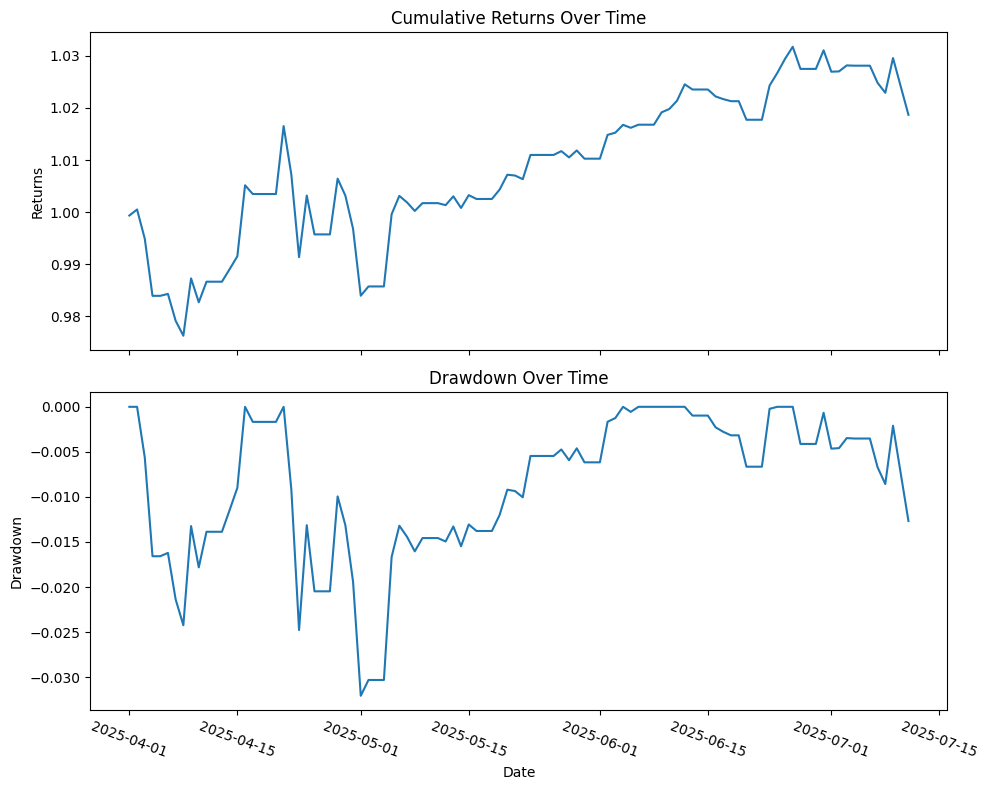

In [15]:
def compute_portfolio_value(trades_df, price_data_dict):
    """
    Compute daily portfolio value given trades and price data.
    
    trades_df: DataFrame with columns ['date', 'ticker', 'quantity', 'price', 'fees']
    price_data_dict: dict mapping ticker -> DataFrame with index 'date' and column 'close'
    
    Returns:
        portfolio_value: Series indexed by date
    """
    # Ensure date types and sort
    trades = trades_df.copy()
    trades['date'] = pd.to_datetime(trades['date'])
    trades.sort_values('date', inplace=True)

    # Determine date index range
    all_dates = pd.date_range(
        start=trades['date'].min(), 
        end=max(df.index.max() for df in price_data_dict.values()),
        freq='D'
    )
    
    # Initialize cash flow and holdings
    cash_flows = pd.Series(0.0, index=all_dates)
    holdings = {ticker: pd.Series(0.0, index=all_dates) for ticker in price_data_dict if ticker != 'CASH'}
    invested_capital = pd.Series(0.0, index=all_dates)
    
    # Process trades
    for _, row in trades.iterrows():
        dt = row['date']
        tk = row['ticker']
        qty = row['quantity']
        price = row['price']
        fees = row['fees']
        
        if tk == 'CASH':
            cash_flows.loc[dt] += qty
            invested_capital[dt:] += qty
        else:
            # Update holdings from this date onward
            holdings[tk].loc[dt:] += qty
            # Cash change: buying (positive qty) -> outflow; selling (negative qty) -> inflow
            cash_flows.loc[dt] += -qty * price - fees
    
    # Compute cumulative cash
    cash = cash_flows.cumsum()
    
    # Compute daily holdings value
    holdings_value = pd.Series(0.0, index=all_dates)
    for tk, pos in holdings.items():
        # Align prices
        # prices = price_data_dict[tk].reindex(all_dates)['close'].fillna(method='ffill')
        prices = price_data_dict[tk].reindex(all_dates)['close'].ffill()
        holdings_value += pos * prices
    
    # Total portfolio value
    portfolio_value = cash + holdings_value
    return portfolio_value, invested_capital

def compute_performance_metrics(portfolio_value, invested_capital, trading_days=252):
    """
    Compute performance metrics: CAGR, volatility, Sharpe ratio, max drawdown
    """
    cumulative_returns = portfolio_value / invested_capital

    # Daily returns
    daily_returns = cumulative_returns.pct_change().dropna()
    
    # CAGR
    total_days = (cumulative_returns.index[-1] - cumulative_returns.index[0]).days
    cagr = (cumulative_returns.iloc[-1] / cumulative_returns.iloc[0]) ** (trading_days / total_days) - 1
    
    # Volatility (annualized)
    vol = daily_returns.std() * np.sqrt(trading_days)
    
    # Sharpe ratio (assumes risk-free rate = 0)
    sharpe = cagr / vol
    
    # Max drawdown
    rolling_max = cumulative_returns.cummax()
    drawdown = (cumulative_returns - rolling_max) / rolling_max
    max_dd = drawdown.min()

    print(f'CAGR:                   {cagr:.2%}')
    print(f'Volatility:             {vol:.2%}')
    print(f'Sharpe Ratio:           {sharpe:.2f}')
    print(f'Max Drawdown:          -{-max_dd:.2%}')
    print(f'Total Returns:          {portfolio_value.iloc[-1] / invested_capital.iloc[-1] - 1:.2%}')
    print(f'Total PnL:             ${portfolio_value.iloc[-1] - invested_capital.iloc[-1]:.2f}')
    
    
    return {
        'CAGR': cagr,
        'Volatility': vol,
        'Sharpe Ratio': sharpe,
        'Max Drawdown': max_dd
    }

def plot_portfolio_and_drawdown(portfolio_value, invested_capital):
    """
    Plot portfolio value and drawdown
    """
    cumulative_returns = portfolio_value / invested_capital

    # Compute drawdown
    rolling_max = cumulative_returns.cummax()
    drawdown = (cumulative_returns - rolling_max) / rolling_max
    
    # Plot
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(10, 8))
    
    ax1.plot(cumulative_returns.index, cumulative_returns.values)
    ax1.set_title('Cumulative Returns Over Time')
    ax1.set_ylabel('Returns')
    
    ax2.plot(drawdown.index, drawdown.values)
    ax2.set_title('Drawdown Over Time')
    ax2.set_ylabel('Drawdown')
    ax2.set_xlabel('Date')
    plt.setp(ax2.get_xticklabels(), rotation=-20)
    
    plt.tight_layout()
    plt.show()

# Example usage:
trades_df = pd.read_excel('portfolio_tracker.xlsx')
# trades_df = trades_df.loc[trades_df['ticker'].isin(['SPY', 'TLT', 'GLD', 'SHV', 'CASH'])]
price_data_dict = {
    'SPY': pd.read_pickle(f'./data/raw/price/SPY_{current_date}.pkl'),
    'TLT': pd.read_pickle(f'./data/raw/price/TLT_{current_date}.pkl'),
    'GLD': pd.read_pickle(f'./data/raw/price/GLD_{current_date}.pkl'),
    'SHV': pd.read_pickle(f'./data/raw/price/SHV_{current_date}.pkl'),
    'PPLT': pd.read_pickle(f'./data/raw/price/PPLT_{current_date}.pkl'),
    'URA': pd.read_pickle(f'./data/raw/price/URA_{current_date}.pkl'),
    'USO': pd.read_pickle(f'./data/raw/price/USO_{current_date}.pkl'),
    'IBIT': pd.read_pickle(f'./data/raw/price/IBIT_{current_date}.pkl'),
    'EEM': pd.read_pickle(f'./data/raw/price/EEM_{current_date}.pkl'),
    'DBA': pd.read_pickle(f'./data/raw/price/DBA_{current_date}.pkl'),
    'IB01.L': pd.read_pickle(f'./data/raw/price/IB01.L_{current_date}.pkl'),
    'LQD': pd.read_pickle(f'./data/raw/price/LQD_{current_date}.pkl'),

}
port_val, invested_cap = compute_portfolio_value(trades_df, price_data_dict)
metrics = compute_performance_metrics(port_val, invested_cap)
plot_portfolio_and_drawdown(port_val, invested_cap)
# for key in metrics:
#     print(f'{key}: {metrics[key]:.2f}')


